In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import re
import os
import sys
from matplotlib import pyplot as plt
from matplotlib import rcParams
import matplotlib
from glob import glob
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

-----
anndata     0.7.4
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 8.0.0
anndata             0.7.4
backcall            0.1.0
cffi                1.13.2
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.2
get_version         2.1
h5py                2.10.0
igraph              0.7.1
importlib_metadata  0.19
ipykernel           5.1.2
ipython_genutils    0.2.0
ipywidgets          7.5.1
jedi                0.15.1
joblib              0.15.1
kiwisolver          1.1.0
legacy_api_wrap     1.2
llvmlite            0.30.0
louvain             0.6.1
matplotlib          3.0.2
more_itertools      8.1.0
mpl_toolkits        NA
natsort             5.1.0
numba               0.46.0
numexpr             2.6.2
numpy               1.18.1
packaging           20.0
pandas              1.1.3
parso               0.5.1
pexpect             4.7.0
pickleshare         0.7.5
pkg_resources       NA
prompt_toolkit      2.0.10
ptyprocess          0.6.0
pygm

In [103]:
sc.settings.set_figure_params(dpi=100, dpi_save=600, vector_friendly=False)
def ReadData(file_in):
    print(file_in)
    adata = sc.read_csv(file_in, first_column_names ='True')
    adata.var_names_make_unique()
    sc.pp.filter_cells(adata, min_genes=200)
    sc.pp.filter_genes(adata, min_cells=2)
    adata.var['mt'] = adata.var_names.str.startswith('MT-')
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, inplace=True)
    sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)
    sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
    sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')
    adata = adata[adata.obs['pct_counts_mt'] < 5, :]
    adata = adata[adata.obs.n_genes_by_counts < 6000, :]
    sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)
    sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
    sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')
    sc.pp.normalize_total(adata, target_sum=1e4)
    adata.raw = adata
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
    sc.pl.highly_variable_genes(adata)
    adata = adata[:, adata.var.highly_variable]
    sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
    sc.pp.scale(adata, max_value=10)
    return adata

def ReadRawData(file_in):
    print(file_in)
    adata = sc.read_10x_mtx(file_in, cache=True)
    adata.var_names_make_unique()
    sc.pp.filter_cells(adata, min_genes=200)
    sc.pp.filter_genes(adata, min_cells=2)
    adata.var['mt'] = adata.var_names.str.startswith('MT-')
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, inplace=True)
    sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
    sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')
    adata1 = adata[adata.obs['pct_counts_mt'] < 10, :]
    print('1')
    print(adata1)
    adata2 = adata[adata.obs.n_genes_by_counts < 6000, :]
    print('2')
    print(adata2)
    adata = adata1[adata1.obs.n_genes_by_counts < 6000, :]
    print('3')
    print(adata)
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
    sc.pl.highly_variable_genes(adata)
    adata = adata[:, adata.var.highly_variable]
    print('4')
    print(adata)
    return adata

def FilterHV(adata):
    sc.pp.log1p(adata)
    adata.raw = adata
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
    sc.pl.highly_variable_genes(adata)
    adata = adata[:, adata.var.highly_variable]
    sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
    sc.pp.scale(adata, max_value=10)
    return adata

def MergeSampes(list_adata, join='inner'):
    out = list_adata[0].concatenate(list_adata[1:], batch_categories=[i.VarName for i in list_adata], join=join)
    if join == 'outer':
        out.X = np.nan_to_num(out.X)
    return out

def GetMultiSampleVar(list_adata, method='intersection'):
    set_all = set(list_adata[0].var.index)
    for adata in list_adata[1:]:
        if method == 'intersection':
            set_all = set_all & set(adata.var.index)
        elif method == 'union':
            set_all = set_all | set(adata.var.index)
    return list(set_all)

def RunClustering(adata):
    sc.tl.pca(adata, svd_solver='arpack')
    sc.pl.pca_variance_ratio(adata, log=True)
    sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
    sc.tl.umap(adata)
#    sc.tl.tsne(adata)
    sc.tl.louvain(adata, resolution=1)
    sc.pl.umap(adata, color=['louvain',], legend_loc='on data')
#    adata.write(outfile)
    return adata

def RunBbknnClustering(adata):
    sc.tl.pca(adata, svd_solver='arpack')
    sc.pl.pca_variance_ratio(adata, log=True)
    sc.external.pp.bbknn(adata, batch_key='batch', approx=True, metric='angular', copy=False,)
    sc.tl.umap(adata)
#    sc.tl.tsne(adata)
    sc.tl.louvain(adata)
    sc.pl.umap(adata, color=['louvain',], legend_loc='on data')
#    adata.write(outfile)
    return adata


def PlotMarker(adata, maker, use_raw=False):
    sc.settings.set_figure_params(dpi=100)
    print('Analyze {} of {}'.format(maker, adata.VarName))
    list_tp = []
    list_out = []
    if type(maker) == str:
        list_tp.append(maker)
    elif type(maker) == list:
        list_tp = maker
    for tp in list_tp:
        if use_raw:
            if tp in adata.raw.var.index:
                list_out.append(tp)
            else:
                print('{} is not expressed in {}'.format(tp, adata.VarName))
        else:
            if tp in adata.var.index:
                list_out.append(tp)
            else:
                print('{} is not expressed in {}'.format(tp, adata.VarName))
    if len(list_out) >= 1:
        sc.pl.stacked_violin(adata, list_out, groupby='louvain', rotation=90, standard_scale='none', use_raw=use_raw)
        sc.pl.umap(adata, color=['louvain',]+list_out, use_raw=use_raw,legend_loc='on data', alpha=0.8)
    else:
        print('None of the marker genes expressed in {}'.format(adata.VarName))

def GetCell(adata, tp):
    if type(tp) == str:
        out = adata[adata.obs.louvain==tp,:]
    elif type(tp) == list:
        list_tp = set(tp)
        out = adata[[i.obs.index[0] for i in adata if i.obs.louvain[0] in list_tp],:]
    out.VarName = adata.VarName
    return out

def RunDPT(adata):
    sc.tl.diffmap(adata)
    sc.tl.dpt(adata, n_branchings=1, n_dcs=10)
    sc.pl.diffmap(adata, color=['dpt_pseudotime', 'dpt_groups', 'batch'])

def RunPAGA(adata):
    sc.tl.draw_graph(adata)
    sc.pl.draw_graph(adata, color='louvain', legend_loc='on data')
    sc.tl.diffmap(adata)
    sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_diffmap')
    sc.tl.paga(adata, groups='louvain')
    sc.pl.paga(adata)
    sc.tl.draw_graph(adata, init_pos='paga')
    sc.pl.draw_graph(adata, color='louvain')
    sc.pl.paga_compare(
    adata, threshold=0.03, title='', right_margin=0.2, size=10, edge_width_scale=0.5,
    legend_fontsize=12, fontsize=12, frameon=False, edges=True, save=True)

def GetPercent(adata, x='group', y='louvain'):
    pd_data = pd.DataFrame(adata.obs)
    dict_tmp = {}
    for index in pd_data.index:
        if pd_data.loc[index,x] not in dict_tmp:
            dict_tmp[pd_data.loc[index,x]] = {}
        if pd_data.loc[index,y] not in dict_tmp[pd_data.loc[index,x]]:
            dict_tmp[pd_data.loc[index,x]][pd_data.loc[index,y]] = 1
        else:
            dict_tmp[pd_data.loc[index,x]][pd_data.loc[index,y]] += 1
    list_cls = []
    for sample in sorted(dict_tmp.keys()):
        for m in sorted(dict_tmp[sample].keys()):
            if m not in list_cls:
                list_cls.append(m)
#    list_sample = ['CON', 'HSIL', 'MIC', 'CSC']
    list_sample = sorted(dict_tmp.keys())
    pd_out = pd.DataFrame(index=list_sample, columns=list_cls)
    for sample in list_sample:
        list_tmp = []
        for m in list_cls:
            if m not in dict_tmp[sample]:
                list_tmp.append('0')
            else:
                list_tmp.append(str(dict_tmp[sample][m]))
        total = sum([int(i) for i in list_tmp])
        list_out = [round(float(i)/total, 4) for i in list_tmp]
        pd_out.loc[sample,:] = list_out
        pd_out.loc[sample,:] = list_tmp
    return pd_out
            
def PercentPlot(pd_data,outfile):
    pd_data = pd_data.loc[['WBC10_1','WBC12','WBC14','WBC17'],:]
#    plt.style.use(['my-paper', 'my-line'])
    fig, axe = plt.subplots(figsize=(20, 12))
    x = range(1, len(pd_data.index)+1)
    colormap = matplotlib.cm.tab20.colors
    base = np.array([0,]*pd_data.shape[0])
    print(base)
    i = 0
    for col in pd_data.columns:
        base_befor = base
        print(np.array(pd_data[col]))
        base = base+pd_data[col]
#    axe.plot(x, list(base), linewidth=6, color=colormap[i])
        print(list(base_befor))
        print(list(base))
        axe.fill_between(x, list(base_befor), list(base), color=colormap[i], label=col)
        i += 1
    axe.plot([2,2], [0,1], linewidth=6, color='white', linestyle='--')
#    axe.plot([3,3], [0,1], linewidth=6, color='white', linestyle='--')
    axe.set_xlim(0.8,4.2)
    axe.set_ylim(-0.1,1.1)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,ncol=1);
    axe.spines['right'].set_visible(True)    
    axe.spines['top'].set_visible(True)
    axe.set_xticks([1,2,3,4,])
#    axe.set_xticklabels(['WBC10', 'WBC12', 'WBC15', 'WBC17'])
    axe.set_xticklabels(['WBC10_1','WBC12','WBC14','WBC17'])
    fig.subplots_adjust(right=0.8)
    fig.savefig(outfile, dpi=600)

def GetSampleEep(adata, list_all_gene):
    pd_exp = pd.DataFrame(adata.raw[:,list_all_gene].X.toarray(), index=adata.obs.index, columns=list_all_gene)
    pd_exp[pd_exp<0]=0
#    pd_std = pd_exp.std()
#    pd_fiter = pd_exp[pd_std[pd_std>0.5].index]
#    pd_fiter.to_csv(outfile, sep='\t', header=True, index=True)
    return pd_exp

def FindDiffExp(adata, outpath, filter=True, p=0.05, fold=2):
    result = adata.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    for group in groups:
        pd_out = pd.DataFrame({key:adata.uns['rank_genes_groups'][key][group]
                              for key in ['names', 'logfoldchanges', 'pvals_adj']})
        if filter:
            pd_out = pd_out.loc[pd_out.loc[:, 'pvals_adj']<p,:]
            pd_out = pd_out.loc[abs(pd_out.loc[:, 'logfoldchanges'])>np.log(fold),:]
            pd_out.to_csv(os.path.join(outpath, 'cls_'+group+'_diff.txt'), sep='\t', header=True, index=False)
        else:
            pd_out.to_csv(os.path.join(outpath, 'cls_'+group+'_all.txt'), sep='\t', header=True, index=False)
#    pd_out=pd_out.loc[pd_out.iloc[:,2]<p,:]

def GetGroupExp(adata, pd_matrix, key):
    dict_class = {}
    pd_matrix = pd_matrix.T
    for i in adata.obs.index:
        vls = adata.obs[key][i]
        if vls not in dict_class:
            dict_class[vls] = [i,]
        else:
            dict_class[vls] += [i,]
    keys = dict_class.keys()
    pd_out = pd.DataFrame()
    for key in keys:
        pd_sub = pd_matrix.loc[:, dict_class[key]]
        pd_1 = pd.DataFrame(pd_sub.mean(1))
        pd_1.columns=[key, ]
        pd_out = pd_out.append(pd_1.T)
    return pd_out.T

def GetFoldChange(pd_data):
    list_label = list(pd_data.columns)
    pd_out = pd.DataFrame(index=pd_data.index, columns=['FC','log2FC',])
    for index in pd_data.index:
        fc = (pd_data.loc[index, list_label[1]]+0.0001)/(pd_data.loc[index, list_label[0]]+0.0001)
        pd_out.loc[index,'FC'] = fc
        pd_out.loc[index,'log2FC'] = np.log2(fc )
    return pd_out.sort_values('FC', ascending=False)

In [11]:
list_sample = ['WBC10_1','WBC10_2','WBC12','WBC14','WBC15','WBC17']
list_group = ['WBC10_1', 'WBC12', 'WBC14', 'WBC17']
dict_group = {'WBC10_1':'WBC10_1','WBC10_2':'WBC12','WBC12':'WBC12','WBC14':'WBC14','WBC15':'WBC17','WBC17':'WBC17'}

In [15]:
list_tmp = []
for obs in MergedData_filter.obs.index:
    batch = pd.DataFrame(MergedData_filter.obs).loc[obs,'batch']
    list_tmp.append(dict_group[batch])

In [16]:
MergedData_filter.obs['group'] = list_tmp

# Reading data

/home/lixuefei/Project/20190809_SC/RUN/RawData/WBC10/
... reading from cache file cache/home-lixuefei-Project-20190809_SC-RUN-RawData-WBC10-matrix.h5ad


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


filtered out 5 cells that have less than 200 genes expressed


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


filtered out 14651 genes that are detected in less than 2 cells


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'feature_types' as categorical


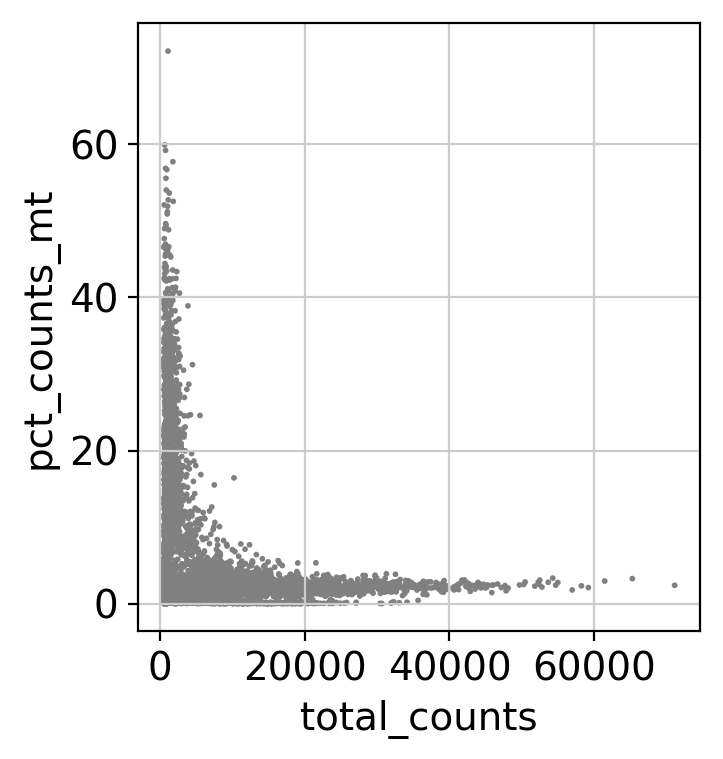

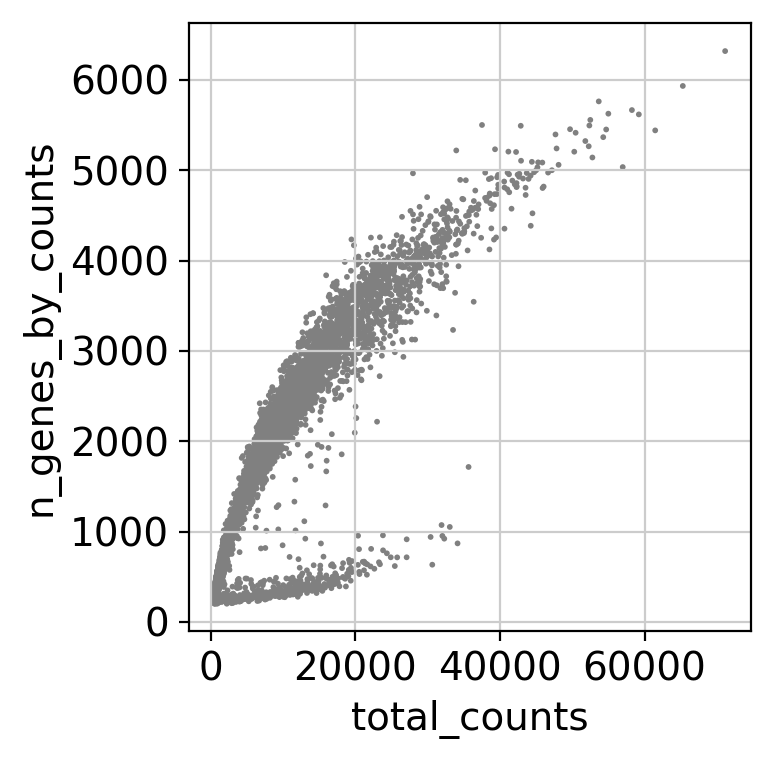

/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual

1
View of AnnData object with n_obs × n_vars = 5513 × 18887
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
2
View of AnnData object with n_obs × n_vars = 6950 × 18887
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
3
View of AnnData object with n_obs × n_vars = 5512 × 18887
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_co

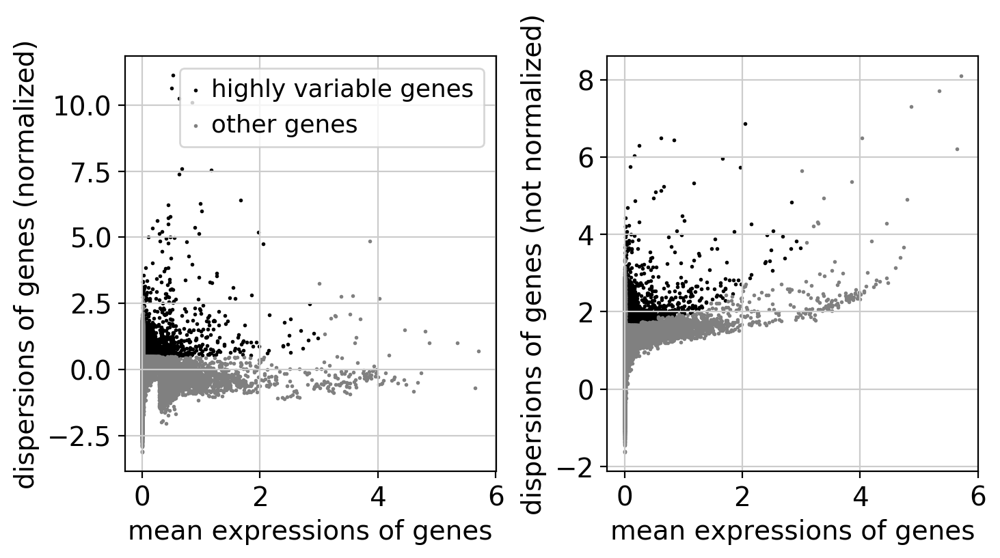

4
View of AnnData object with n_obs × n_vars = 5512 × 4368
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
/home/lixuefei/Project/20190809_SC/RUN/RawData/WBC10_2/
... reading from cache file cache/home-lixuefei-Project-20190809_SC-RUN-RawData-WBC10_2-matrix.h5ad


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


filtered out 923 cells that have less than 200 genes expressed


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


filtered out 13583 genes that are detected in less than 2 cells


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'feature_types' as categorical


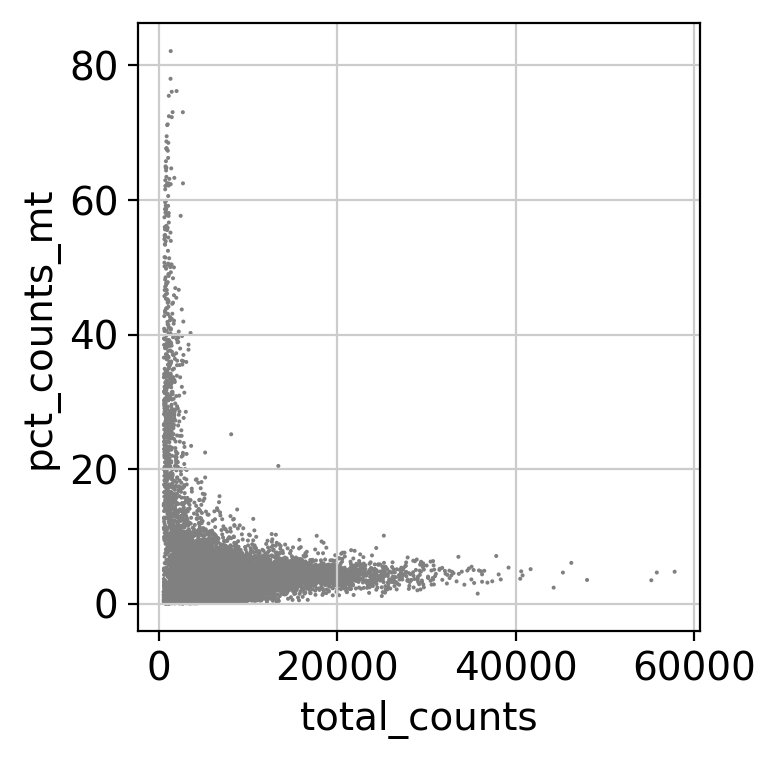

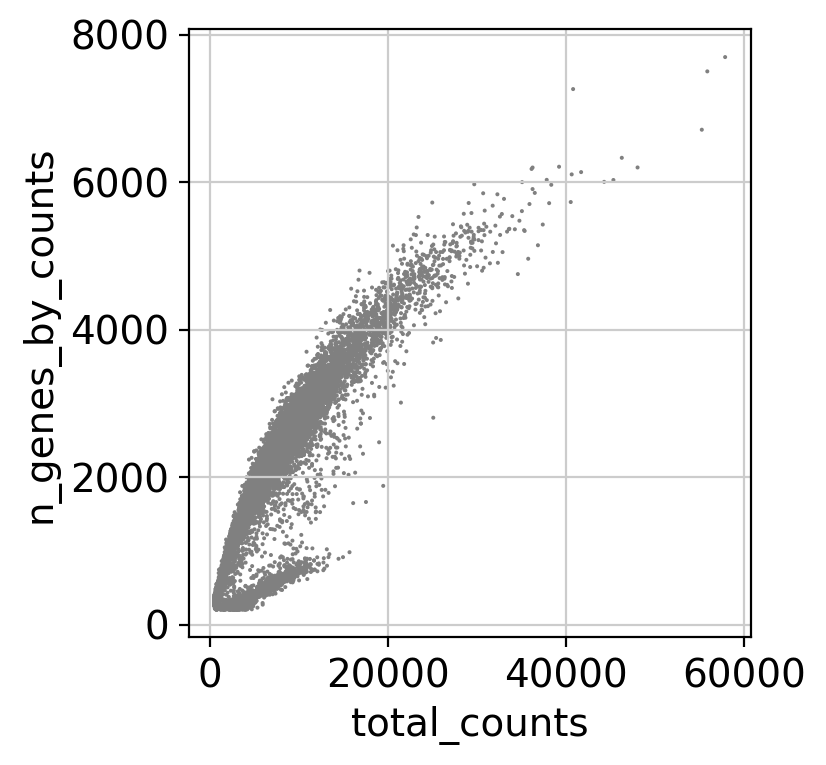

1
View of AnnData object with n_obs × n_vars = 13301 × 23018
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
2
View of AnnData object with n_obs × n_vars = 14294 × 23018
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
3
View of AnnData object with n_obs × n_vars = 13286 × 23018
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total

/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual

    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


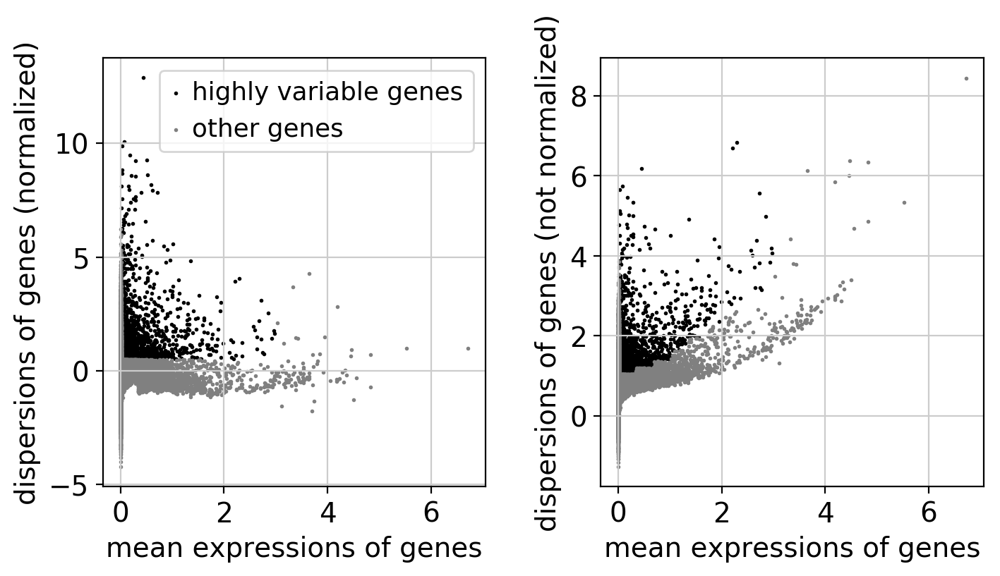

4
View of AnnData object with n_obs × n_vars = 13286 × 2405
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
/home/lixuefei/Project/20190809_SC/RUN/RawData/WBC12/
... reading from cache file cache/home-lixuefei-Project-20190809_SC-RUN-RawData-WBC12-matrix.h5ad


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


filtered out 22 cells that have less than 200 genes expressed
filtered out 14330 genes that are detected in less than 2 cells


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'feature_types' as categorical


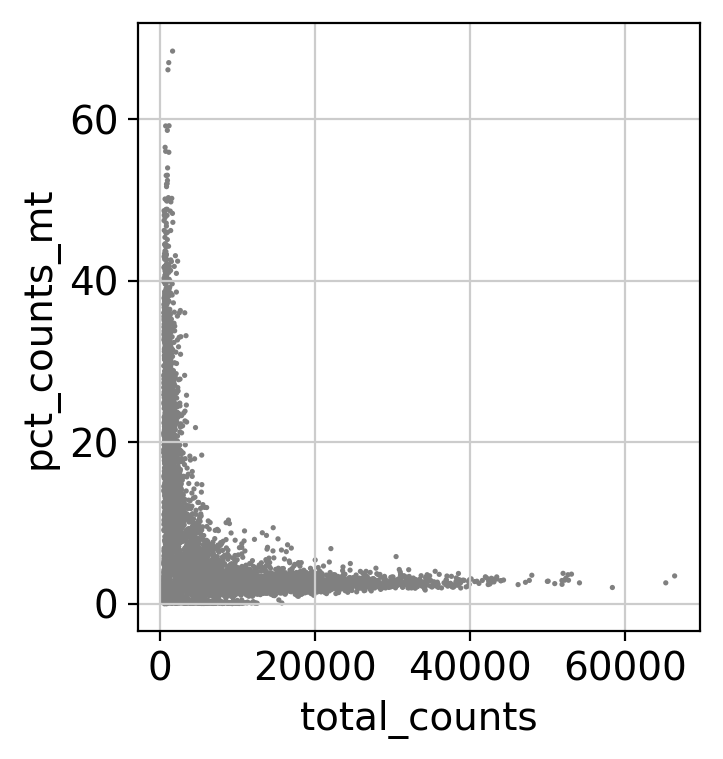

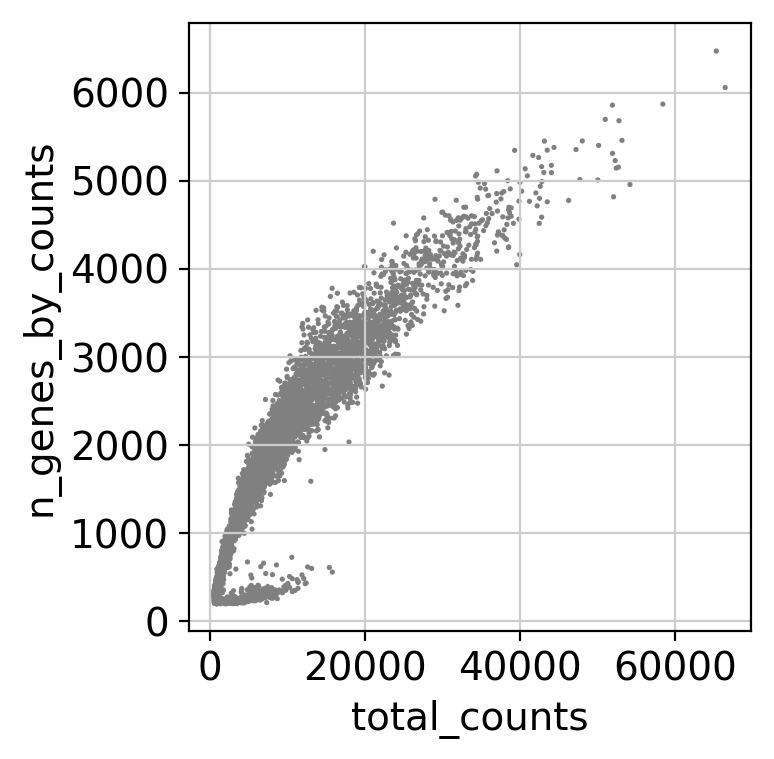

1
View of AnnData object with n_obs × n_vars = 6067 × 19208
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
2
View of AnnData object with n_obs × n_vars = 8428 × 19208
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
3
View of AnnData object with n_obs × n_vars = 6065 × 19208
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_co

/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


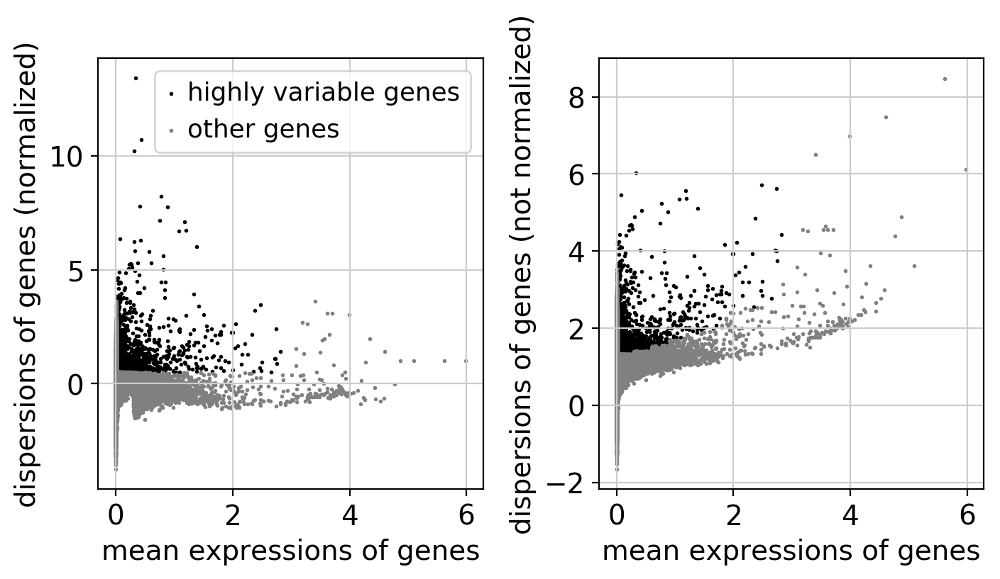

4
View of AnnData object with n_obs × n_vars = 6065 × 3425
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
/home/lixuefei/Project/20190809_SC/RUN/RawData/WBC13/
... reading from cache file cache/home-lixuefei-Project-20190809_SC-RUN-RawData-WBC13-matrix.h5ad


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


filtered out 284 cells that have less than 200 genes expressed


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


filtered out 13927 genes that are detected in less than 2 cells


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'feature_types' as categorical


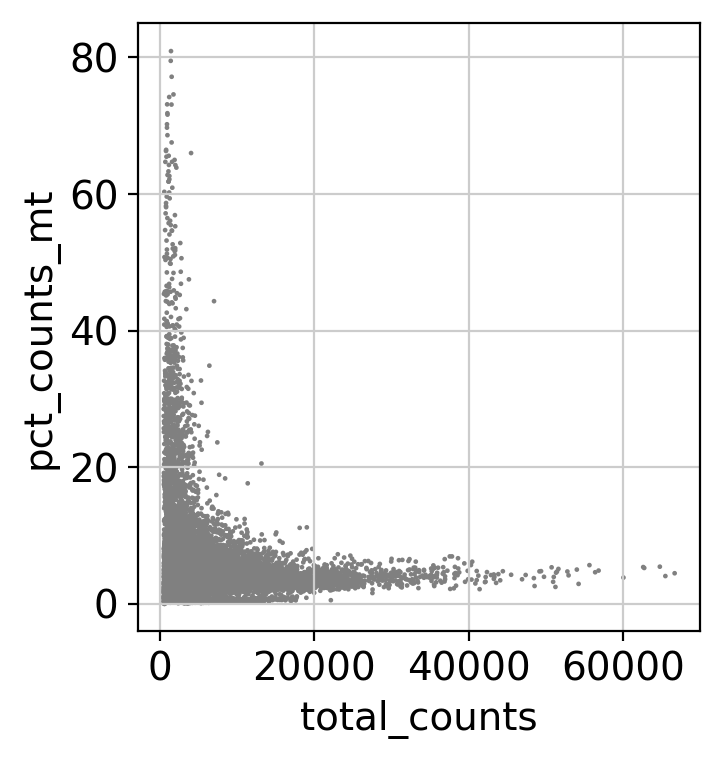

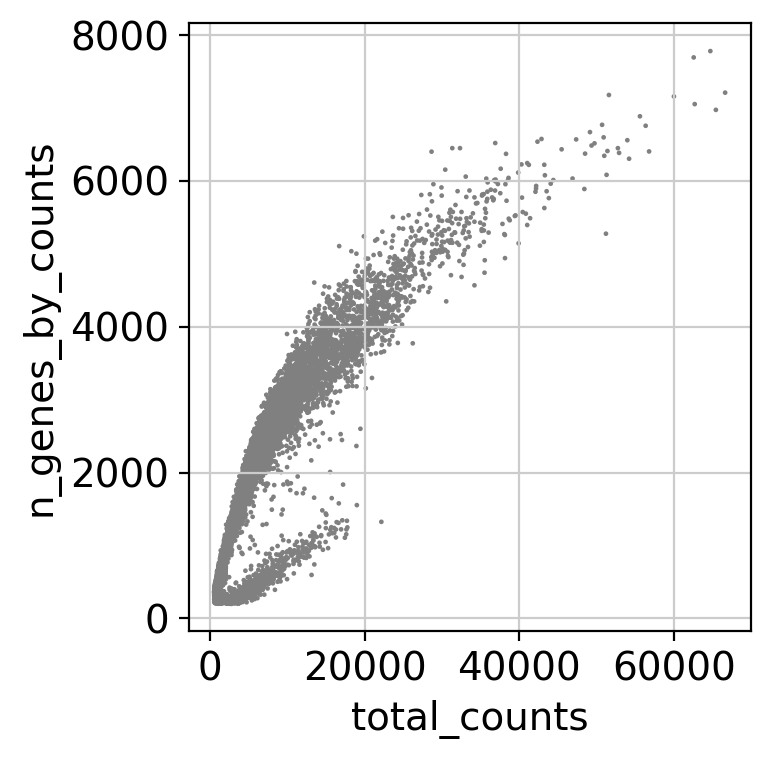

/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual

1
View of AnnData object with n_obs × n_vars = 9150 × 22674
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
2
View of AnnData object with n_obs × n_vars = 10389 × 22674
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
3
View of AnnData object with n_obs × n_vars = 9102 × 22674
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_c

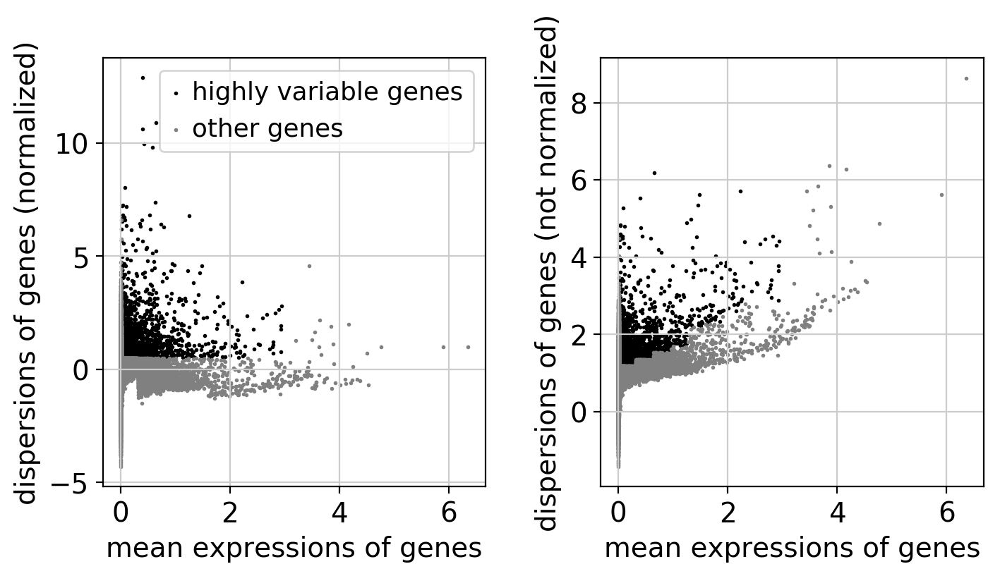

4
View of AnnData object with n_obs × n_vars = 9102 × 3863
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
/home/lixuefei/Project/20190809_SC/RUN/RawData/WBC15/
... reading from cache file cache/home-lixuefei-Project-20190809_SC-RUN-RawData-WBC15-matrix.h5ad


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


filtered out 289 cells that have less than 200 genes expressed


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


filtered out 14627 genes that are detected in less than 2 cells


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'feature_types' as categorical


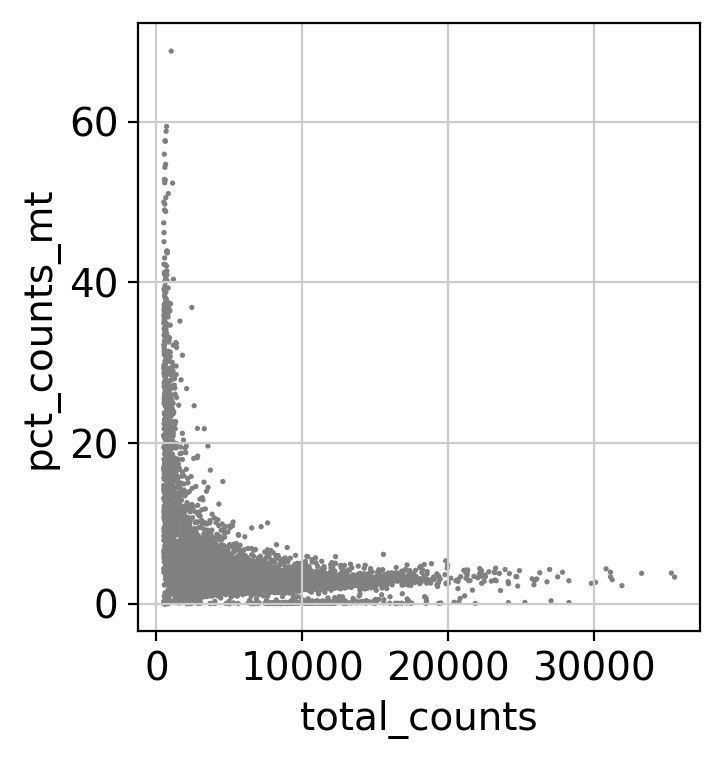

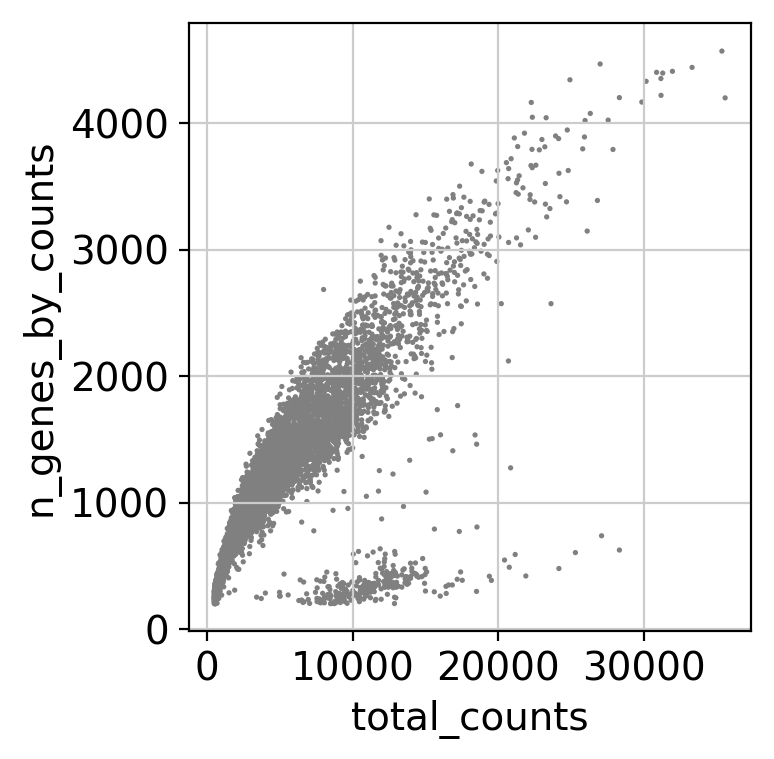

1
View of AnnData object with n_obs × n_vars = 7510 × 18911
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
2
View of AnnData object with n_obs × n_vars = 8274 × 18911
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
3
View of AnnData object with n_obs × n_vars = 7510 × 18911
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_co

/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


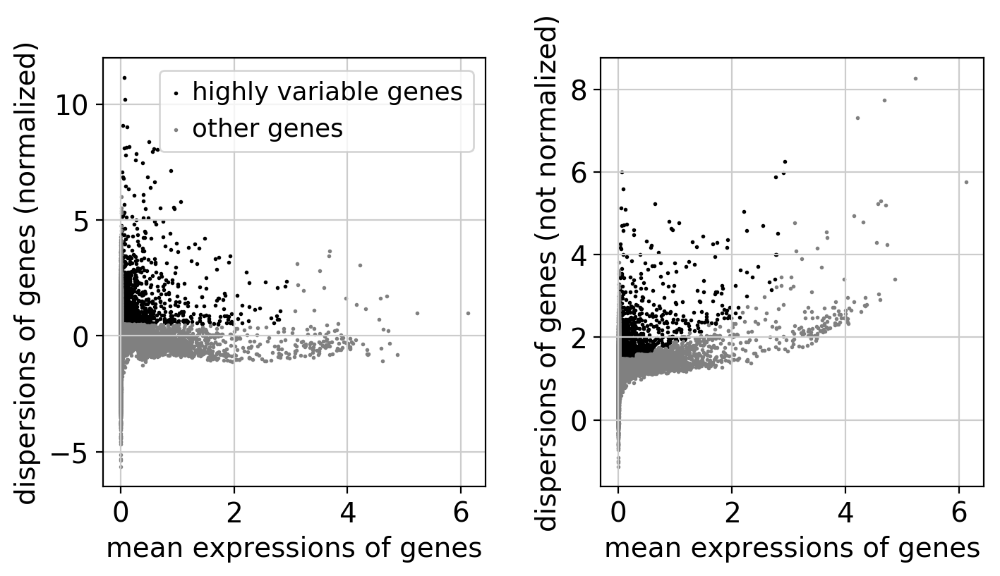

4
View of AnnData object with n_obs × n_vars = 7510 × 2499
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
/home/lixuefei/Project/20190809_SC/RUN/RawData/WBC17/
... reading from cache file cache/home-lixuefei-Project-20190809_SC-RUN-RawData-WBC17-matrix.h5ad


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


filtered out 59 cells that have less than 200 genes expressed
filtered out 14164 genes that are detected in less than 2 cells


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'feature_types' as categorical


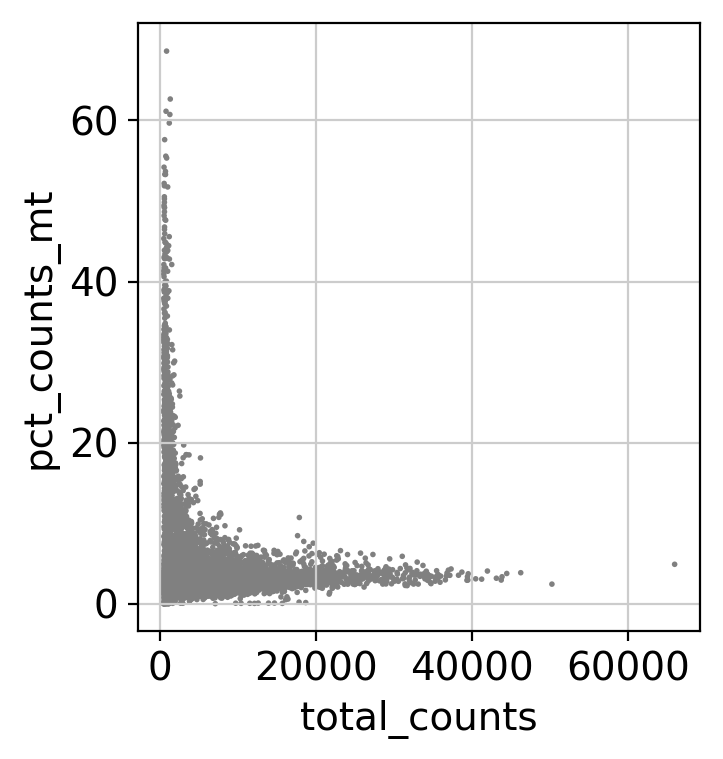

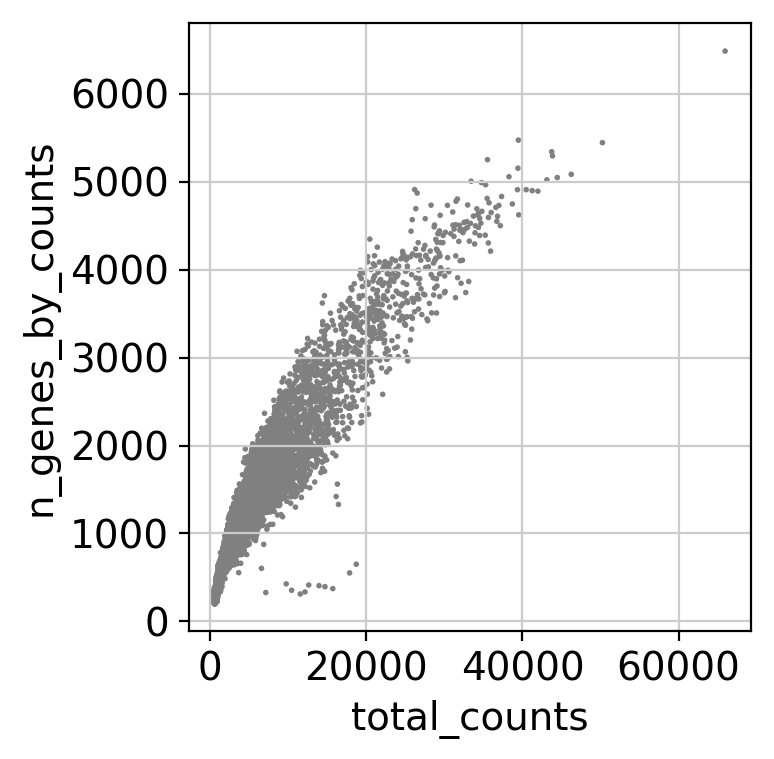

1
View of AnnData object with n_obs × n_vars = 6561 × 19374
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
2
View of AnnData object with n_obs × n_vars = 7374 × 19374
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
3
View of AnnData object with n_obs × n_vars = 6560 × 19374
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_co

/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


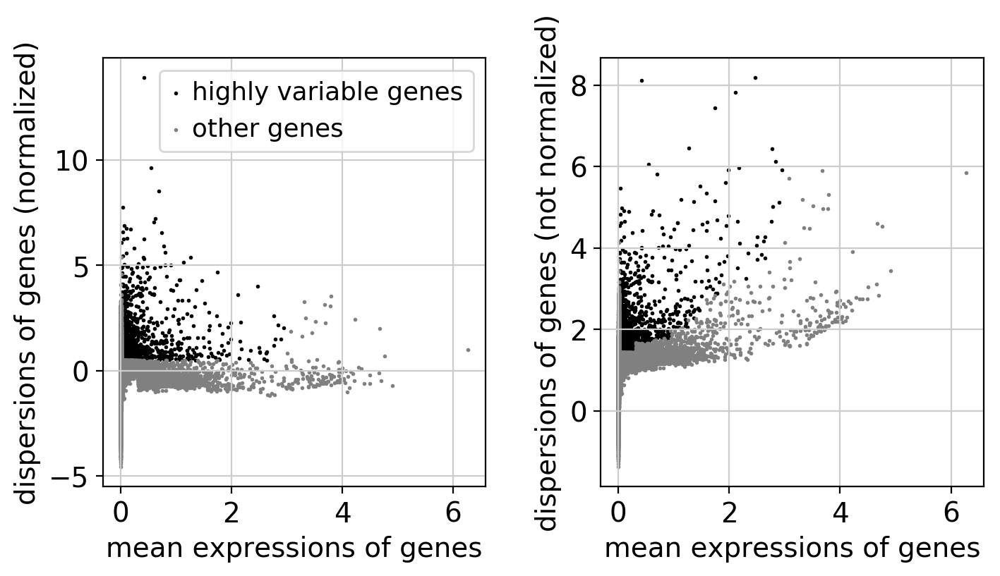

4
View of AnnData object with n_obs × n_vars = 6560 × 2783
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [104]:
WBC10_1 = ReadRawData('/home/lixuefei/Project/20190809_SC/RUN/RawData/WBC10/')
WBC10_2 = ReadRawData('/home/lixuefei/Project/20190809_SC/RUN/RawData/WBC10_2/')
WBC12 = ReadRawData('/home/lixuefei/Project/20190809_SC/RUN/RawData/WBC12/')
WBC14 = ReadRawData('/home/lixuefei/Project/20190809_SC/RUN/RawData/WBC13/')
WBC15 = ReadRawData('/home/lixuefei/Project/20190809_SC/RUN/RawData/WBC15/')
WBC17 = ReadRawData('/home/lixuefei/Project/20190809_SC/RUN/RawData/WBC17/')

In [105]:
WBC10_1.VarName = 'WBC10_1'
WBC10_2.VarName = 'WBC10_2'
WBC12.VarName = 'WBC12'
WBC14.VarName = 'WBC14'
WBC15.VarName = 'WBC15'
WBC17.VarName = 'WBC17'

# Intergrate Data

In [106]:
MergedData = MergeSampes([WBC10_1,WBC10_2,WBC12,WBC14,WBC15,WBC17], join='outer')

extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


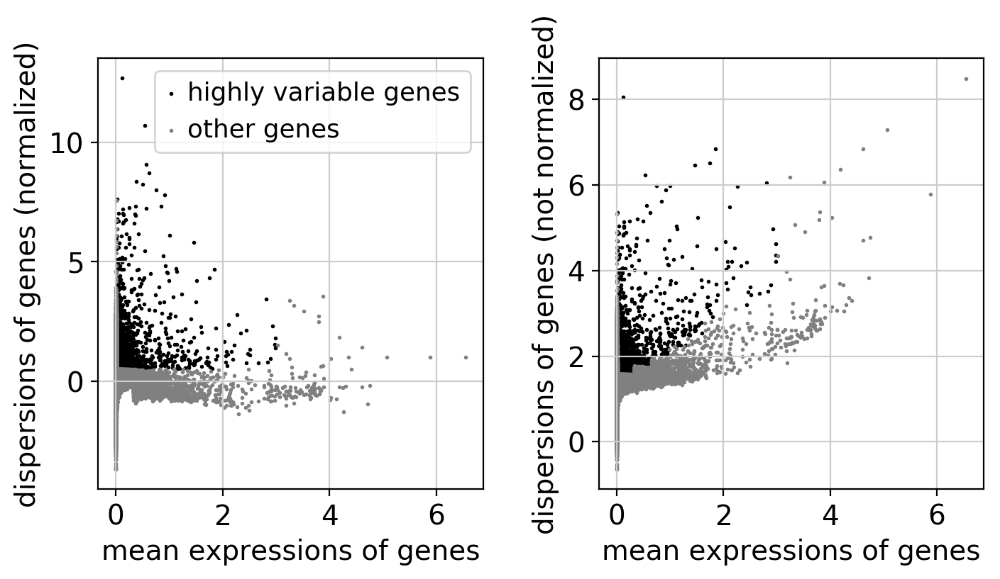

/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.var` of view, copying.
... storing 'gene_ids-WBC10_1' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'mt-WBC10_1' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'gene_ids-WBC10_2' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'mt-WBC10_2' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'gene_ids-WBC12' as categorical
Trying to set at

    finished (0:00:57)


In [96]:
MergedData = FilterHV(MergedData)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


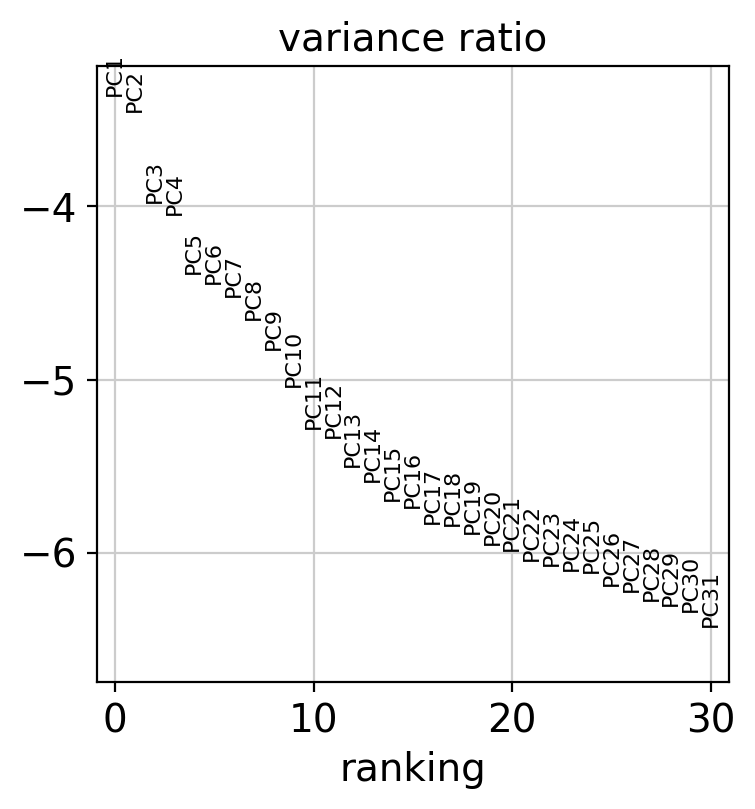

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:07)
computing UMAP


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/bbknn/__init__.py:294: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = bbknn_out[0]
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/bbknn/__init__.py:295: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = bbknn_out[1]


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:49)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 20 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:08)


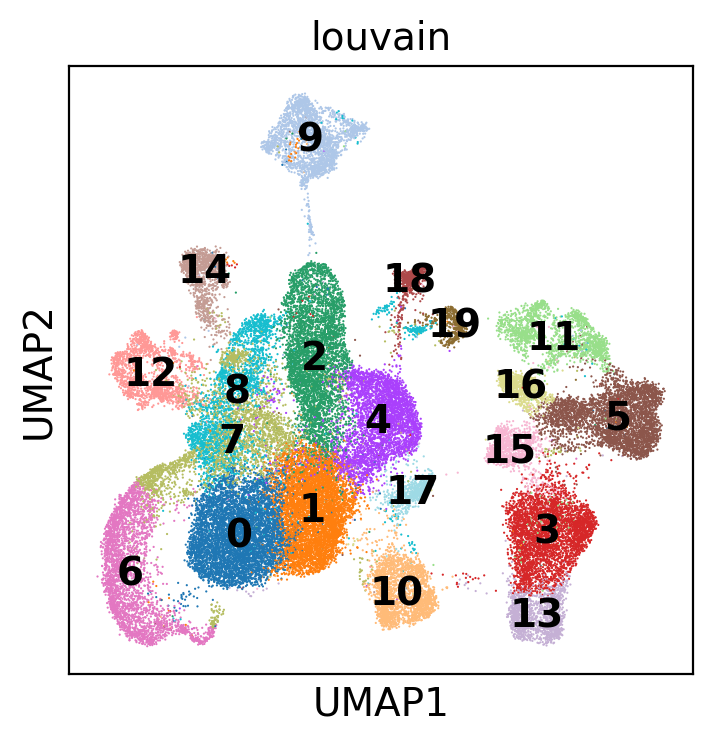

AnnData object with n_obs × n_vars = 48035 × 2091
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'batch', 'louvain'
    var: 'gene_ids-WBC10_1', 'feature_types-WBC10_1', 'n_cells-WBC10_1', 'mt-WBC10_1', 'n_cells_by_counts-WBC10_1', 'mean_counts-WBC10_1', 'log1p_mean_counts-WBC10_1', 'pct_dropout_by_counts-WBC10_1', 'total_counts-WBC10_1', 'log1p_total_counts-WBC10_1', 'gene_ids-WBC10_2', 'feature_types-WBC10_2', 'n_cells-WBC10_2', 'mt-WBC10_2', 'n_cells_by_counts-WBC10_2', 'mean_counts-WBC10_2', 'log1p_mean_counts-WBC10_2', 'pct_dropout_by_counts-WBC10_2', 'total_counts-WBC10_2', 'log1p_total_counts-WBC10_2', 'gene_ids-WBC12', 'feature_types-WBC12', 'n_cells-WBC12', 'mt-WBC12', 'n_cells_by_counts-WBC12', 'mean_counts-WBC12', 'log1p_mean_counts-WBC12', 'pct_dropout_by_counts-WBC12', 'total_counts-WBC12', 'log1p_total_counts-WBC12', 'gene_ids-WBC14', 'feature_types-WBC1

In [25]:
RunBbknnClustering(MergedData)

/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'group' as categorical


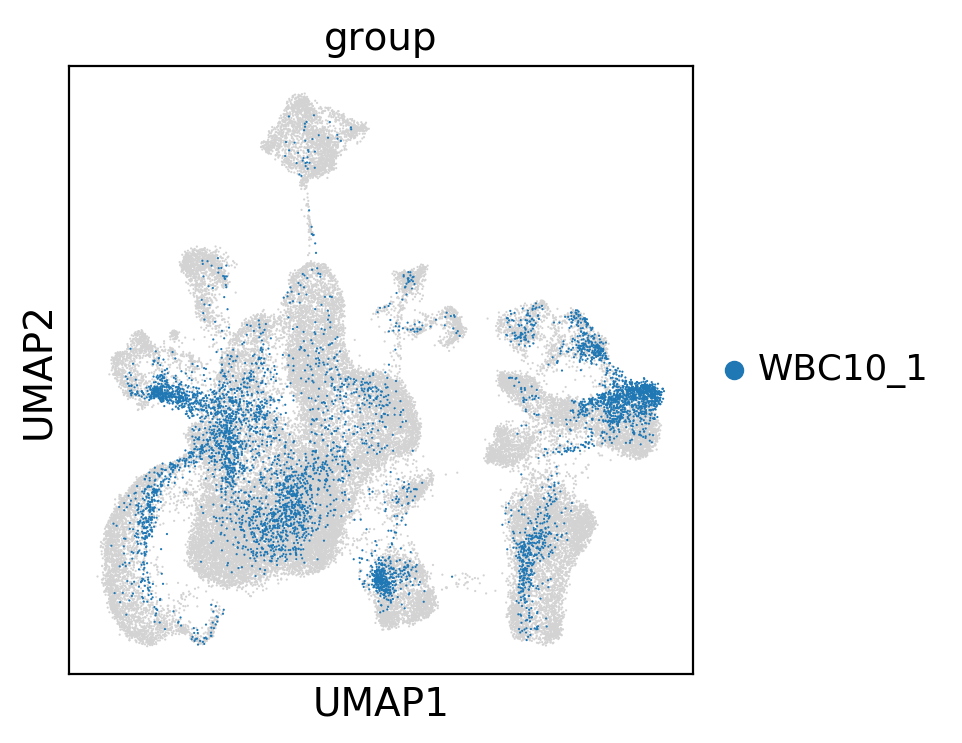

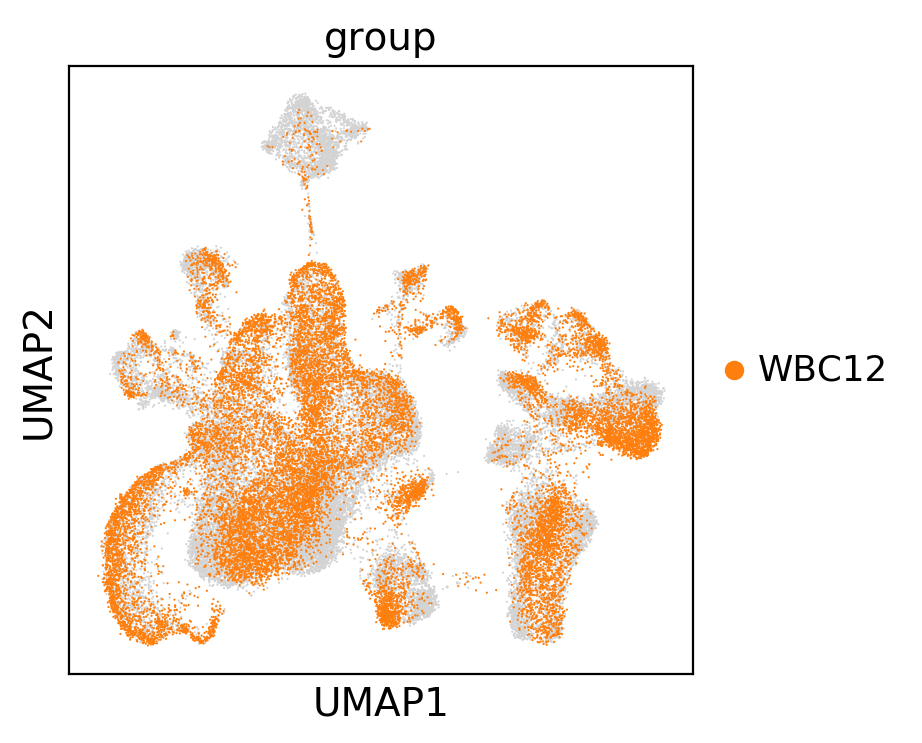

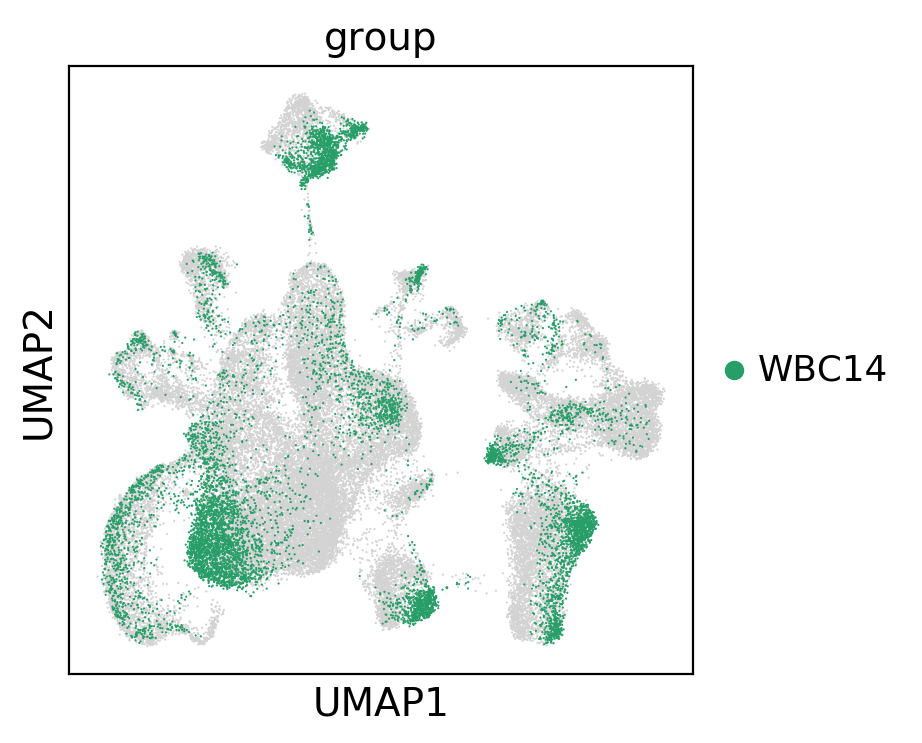

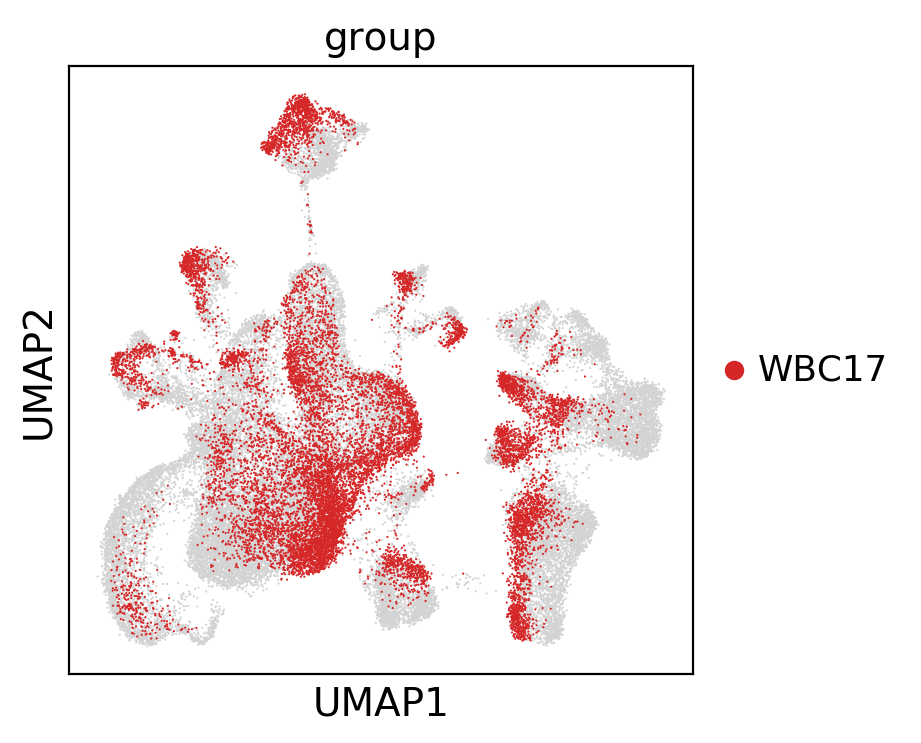

In [236]:
for batch in list_group:
    sc.pl.umap(MergedData, color='group', groups=[batch], use_raw=True)

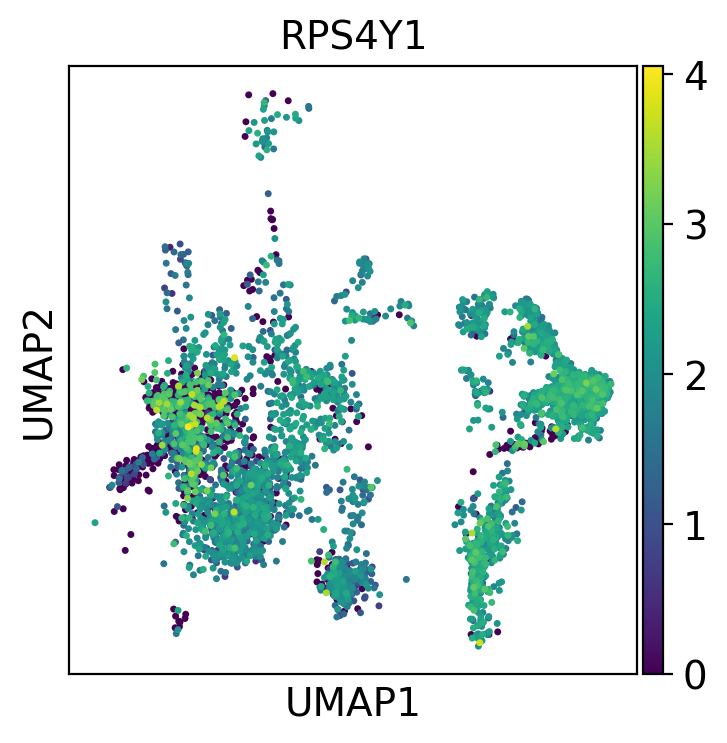

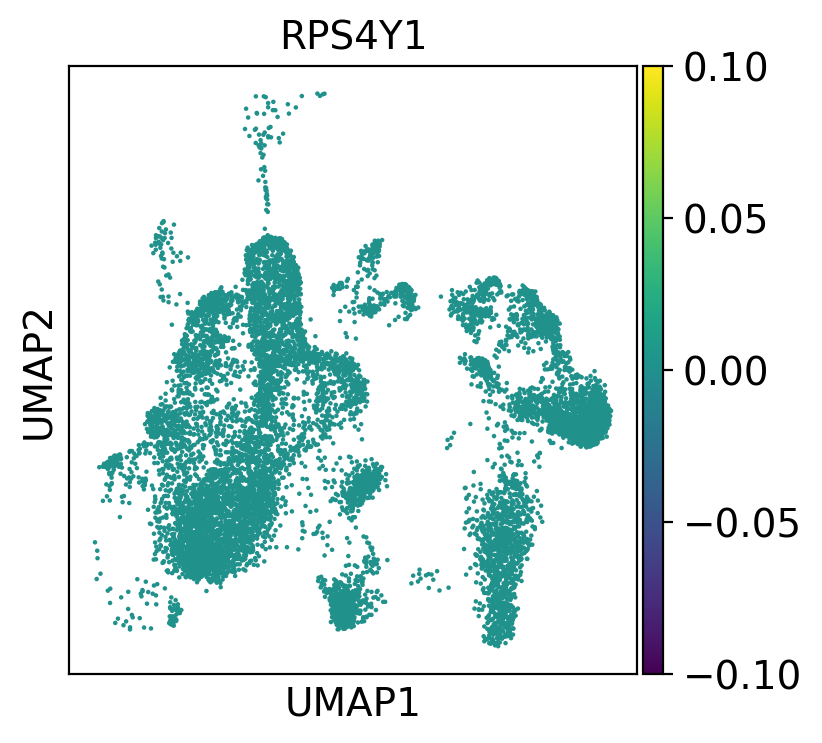

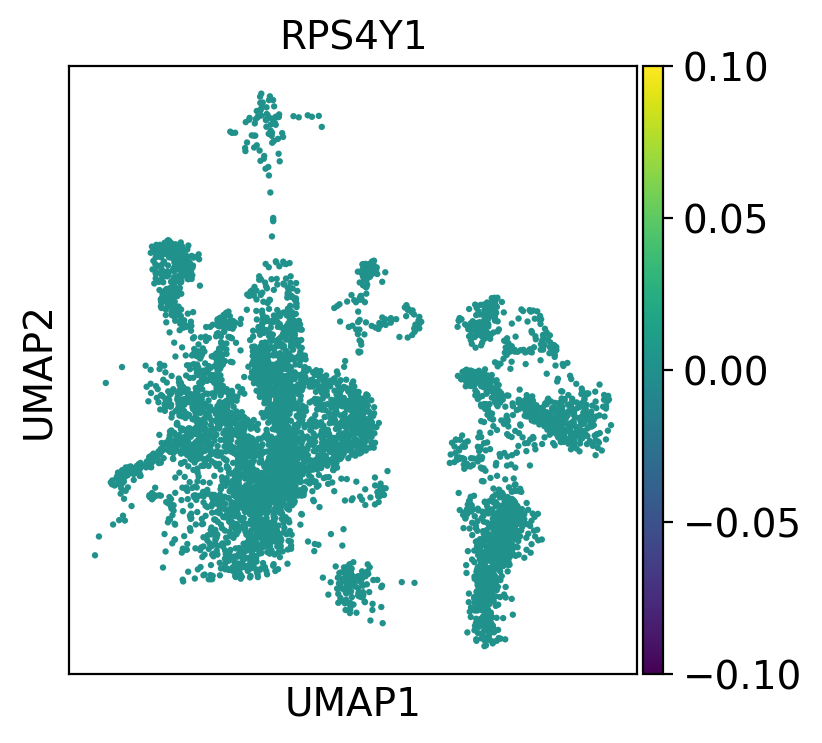

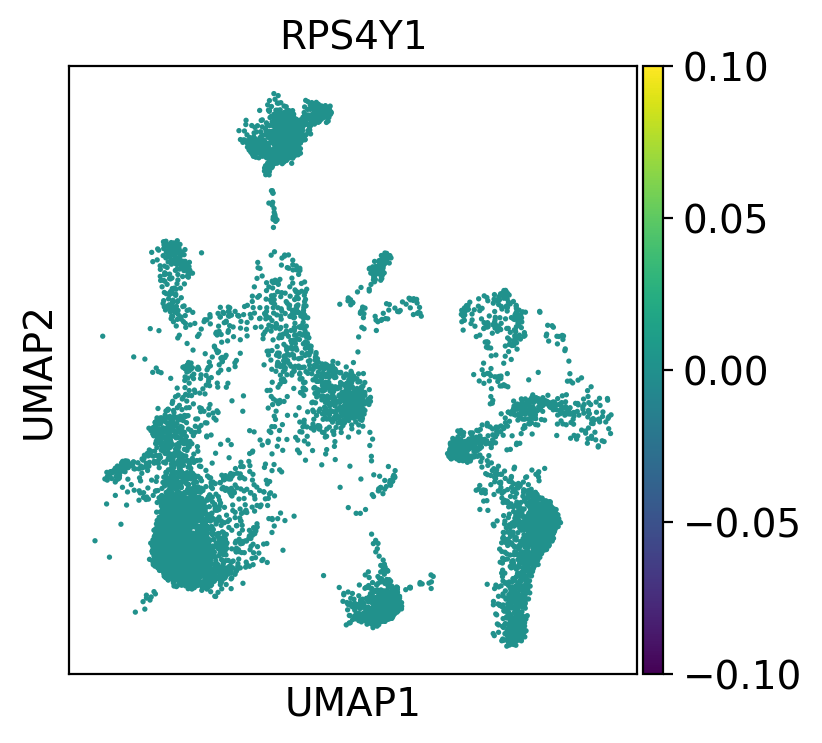

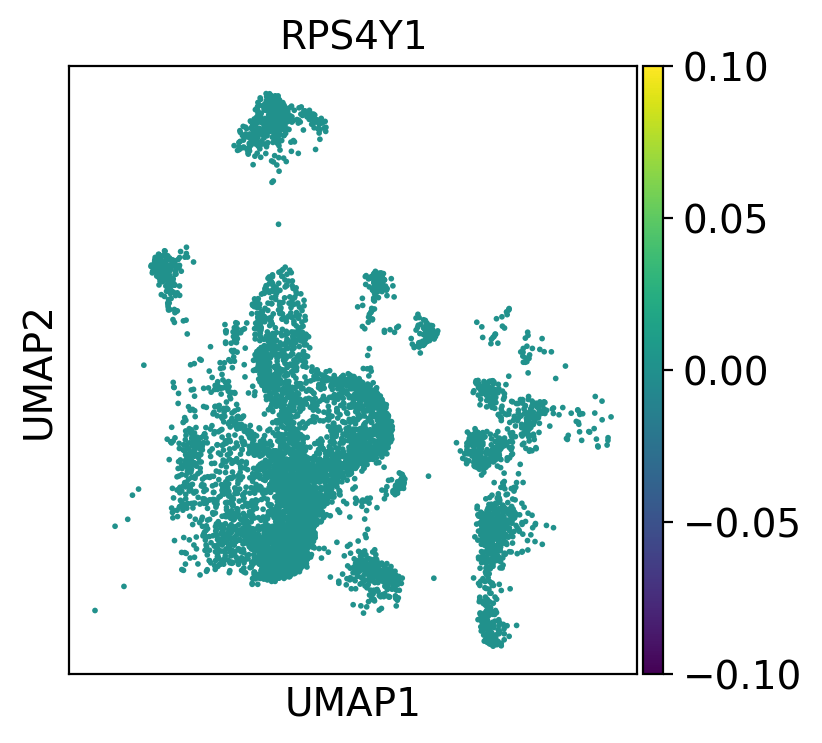

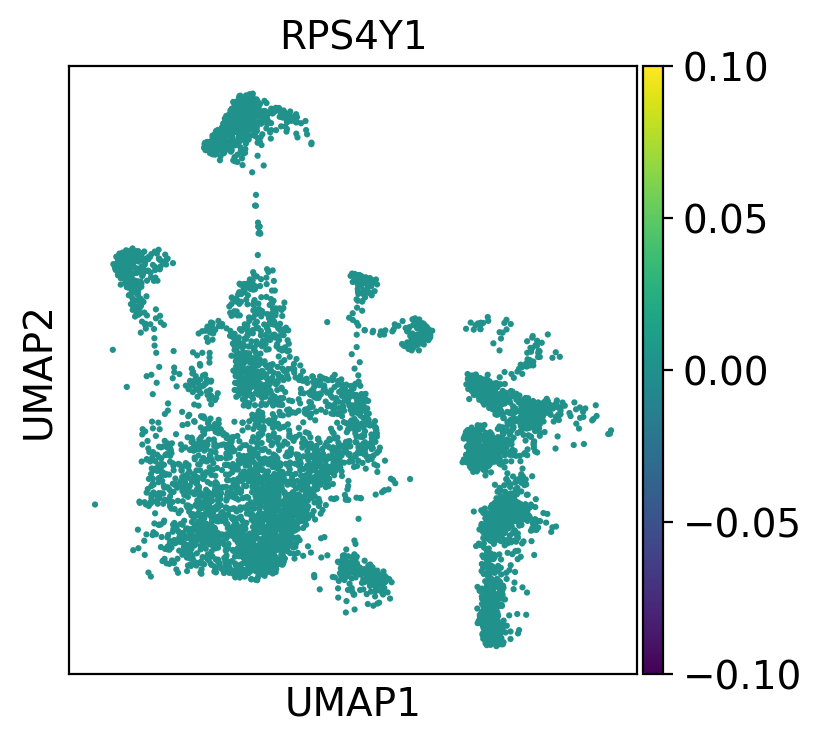

In [108]:
for batch in list_sample:
    adata_tmp = MergedData_filter[MergedData_filter.obs['batch']==batch]
    sc.pl.umap(adata_tmp, color='RPS4Y1',use_raw=True)

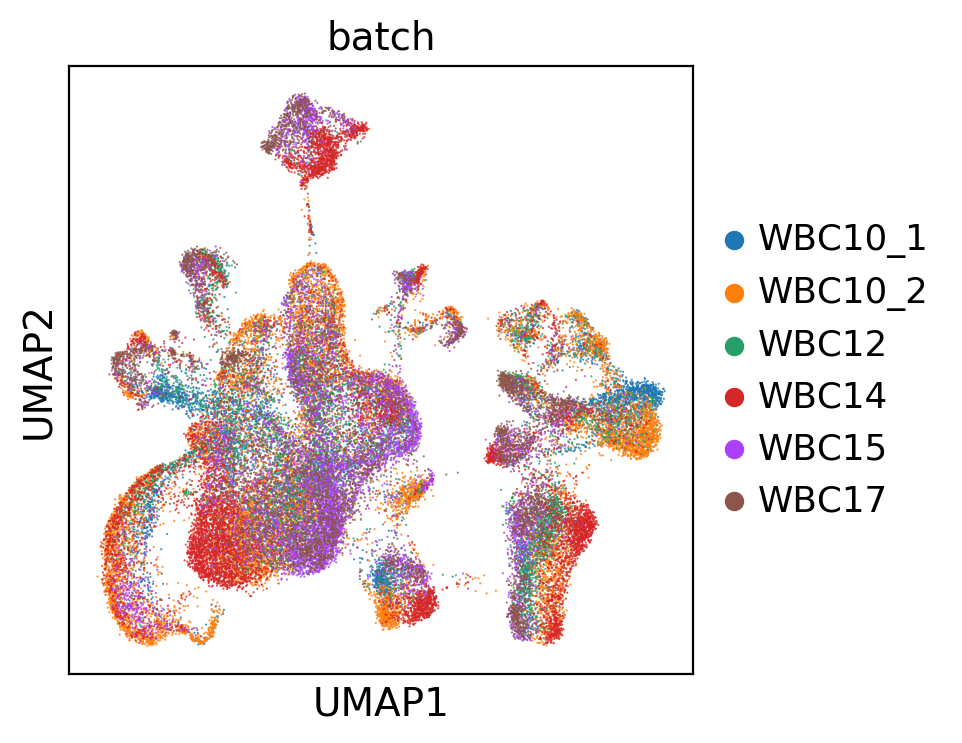

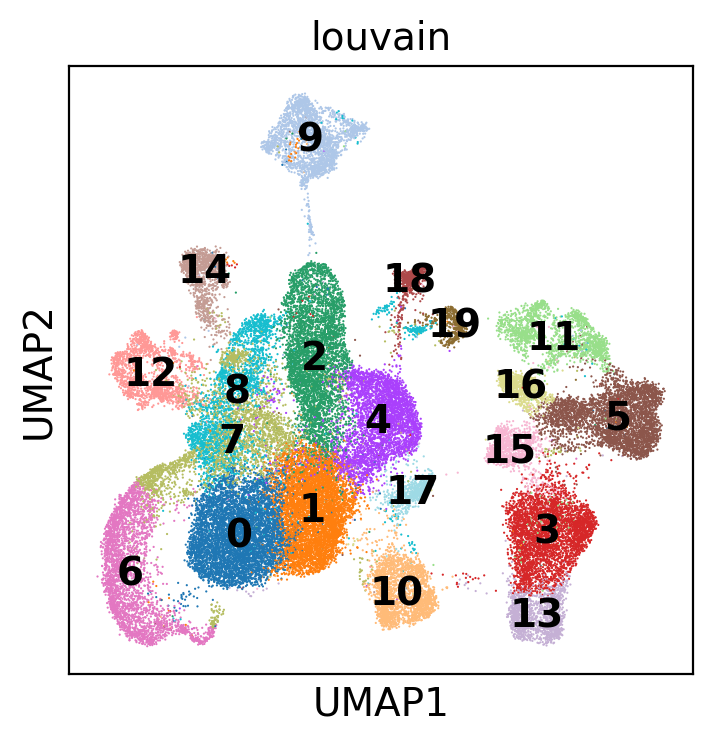

In [27]:
sc.pl.umap(MergedData, color=['batch',], use_raw=False, alpha=0.8)
sc.pl.umap(MergedData, use_raw=False,color=['louvain',], legend_loc='on data')

In [60]:
MergedData.write('/home/lixuefei/Project/20190809_SC/RUN/Basic/20210304/MergedData.h5ad')

In [32]:
GetPercent(MergedData, x='batch', y='louvain')

,0,1,10,11,12,13,14,15,16,17,18,19,2,3,4,5,6,7,8,9
WBC10_1,0.0798,0.0918,0.0708,0.0608,0.0729,0.0102,0.0073,0.0027,0.0058,0.0071,0.0044,0.0034,0.0299,0.0588,0.0372,0.1943,0.0483,0.1284,0.0769,0.0093
WBC10_2,0.1356,0.0688,0.0486,0.0547,0.0166,0.024,0.0045,0.0023,0.0105,0.0287,0.0072,0.0114,0.1217,0.0556,0.0452,0.1141,0.1236,0.0392,0.0818,0.0058
WBC12,0.0528,0.1266,0.0185,0.0392,0.0262,0.019,0.0544,0.0112,0.0272,0.0053,0.0155,0.0049,0.1303,0.1217,0.1059,0.0605,0.0242,0.0981,0.0463,0.0122
WBC14,0.2502,0.0125,0.0673,0.0205,0.0233,0.0399,0.0219,0.0411,0.003,0.0038,0.014,0.0027,0.0326,0.1137,0.0524,0.0283,0.0717,0.0364,0.0403,0.1243
WBC15,0.0622,0.2662,0.0336,0.0063,0.016,0.0193,0.025,0.0289,0.0125,0.0101,0.0148,0.0111,0.1048,0.0554,0.1593,0.0186,0.0356,0.0382,0.0212,0.0611
WBC17,0.0646,0.1662,0.0276,0.0105,0.0588,0.0433,0.0457,0.0538,0.0593,0.0053,0.0114,0.0191,0.0887,0.0733,0.0732,0.0378,0.002,0.0553,0.0244,0.0796


# High resolution

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 27 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:07)


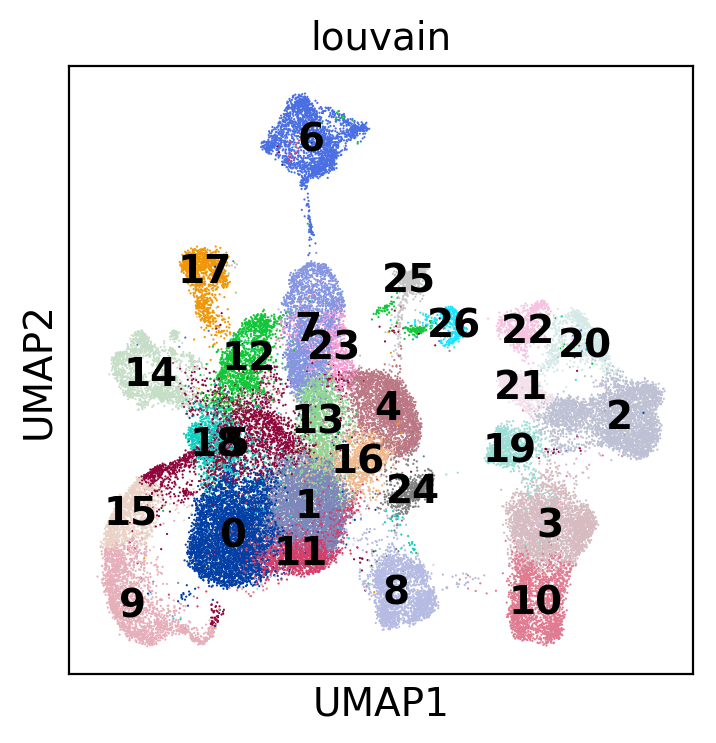

In [34]:
sc.tl.louvain(MergedData, resolution=2)
sc.pl.umap(MergedData, color=['louvain',], legend_loc='on data')

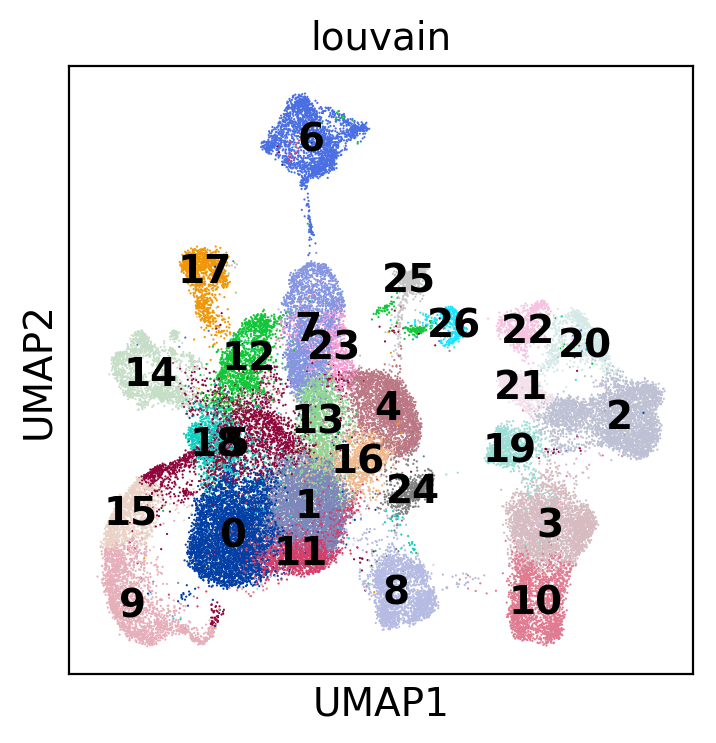

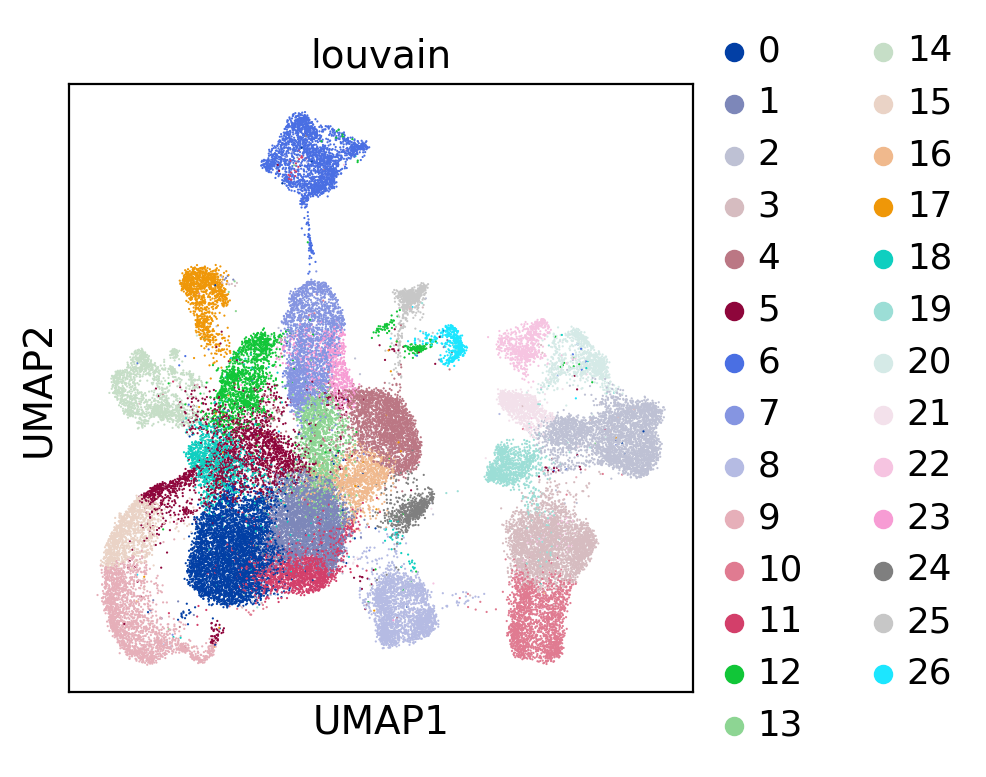

In [35]:
sc.pl.umap(MergedData, color=['louvain',], legend_loc='on data')
sc.pl.umap(MergedData, color=['louvain',],)

# Annotation

In [45]:
dict_anno = {'3':'NK cell', '10':'NK cell', '21':'ILC2', '2':'ILC precursor','19':'T cell',
             '22':'proliferating NK cell', '20':'proliferating ILC', '26':'B cell',
            '25':'pDC', '6':'Mast cell', '17':'cDC1', '4':'cDC2', '16':'cDC2','24':'LC', '8':'mono macrophage',
            '7':'monocyte', '23':'monocyte', '13':'monocyte',
             '0':'TRM','1':'TRM','11':'TRM','5':'TRM',
             '9':'erythrocyte','15':'erythrocyte',
             '14':'fibroblast', '12':'proliferating monocyte','18':'myeloid precursor',
            }
list_anno = []
for lv in MergedData.obs['louvain']:
    if lv in dict_anno:
        list_anno.append(dict_anno[lv])
    else:
        print(lv)
MergedData.obs['annotation'] = list_anno

In [54]:
for obs in MergedData.obs.index:
    anno = MergedData.obs.loc[obs,'annotation']
    if anno == 'proliferating monocyte':
        if MergedData[obs, 'KRT14'].X[0][0] >2:
            MergedData.obs.loc[obs,'annotation'] = 'kerotinocyte'

/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [58]:
list_Lym = ['B cell', 'T cell', 'ILC2', 'ILC precursor', 'NK cell', 'proliferating NK cell', 'proliferating ILC']
list_mye = ['pDC', 'Mast cell', 'cDC1', 'cDC2', 'LC', 'mono macrophage', 'monocyte', 'TRM', 'proliferating monocyte', 'myeloid precursor']
list_TM = []
for obs in MergedData.obs.index:
    anno = MergedData.obs.loc[obs,'annotation']
    if anno in list_Lym:
        list_TM.append('Lymophiod')
    elif anno in list_mye:
        list_TM.append('Myeloid')
    else:
        list_TM.append('Other')
MergedData.obs['TM'] = list_TM

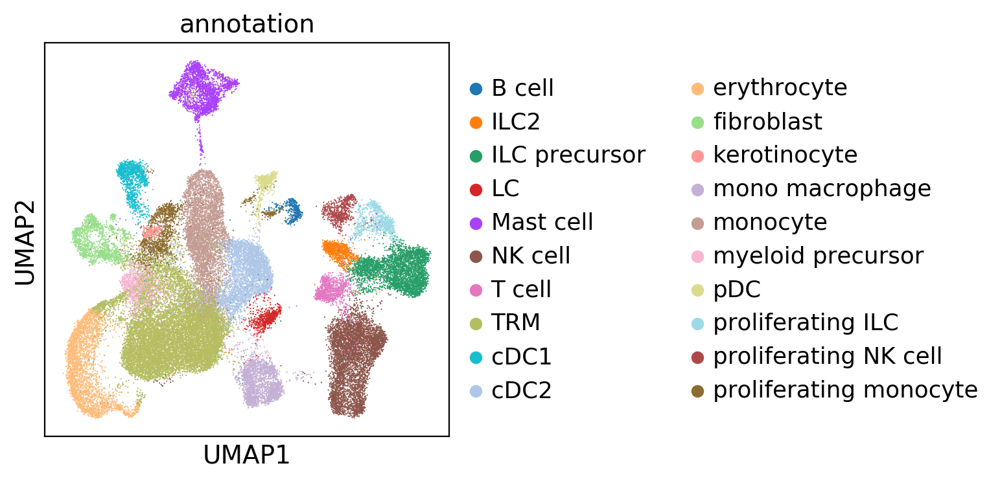

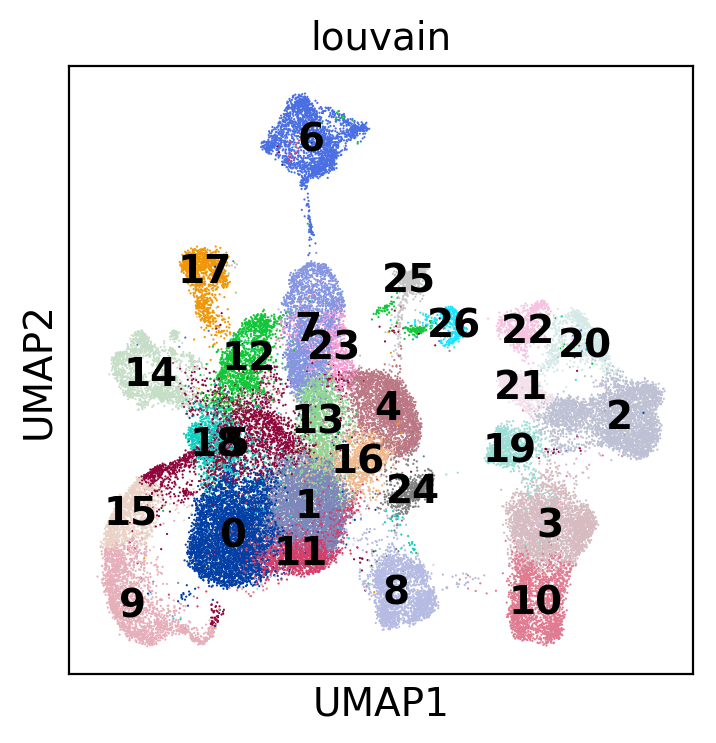

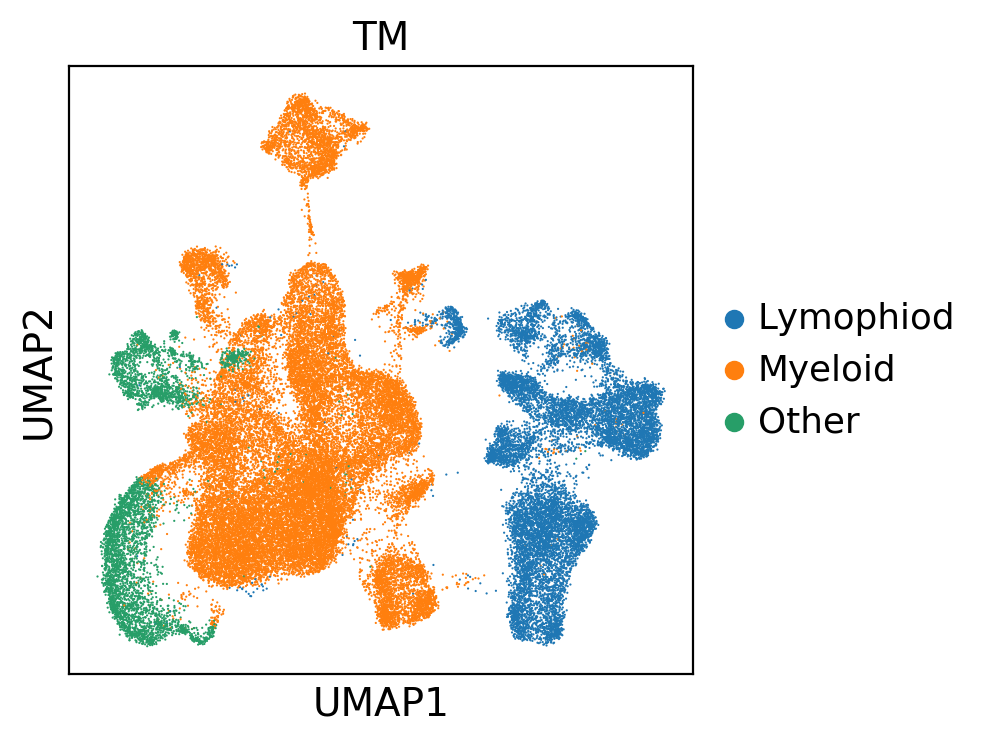

In [237]:
sc.pl.umap(MergedData, color=['annotation',],)
sc.pl.umap(MergedData, color=['louvain',], legend_loc='on data')
sc.pl.umap(MergedData, color=['TM',],)

In [9]:
MergedData_filter = MergedData[MergedData.obs['TM'].isin(['Lymophiod','Myloid'])]

In [26]:
pd_data = GetPercent(MergedData_filter, x='group', y='annotation')

In [28]:
pd_data = pd_data.loc[:,['MyeP','Monocyte','M0-mac','TRM','Mast cell','cDC1','cDC2','pDC','LC','B cells','T cells','ILCP/ILC','NKP/NK']]

# Myloid and Lymophiod

In [61]:
Lymophiod = MergedData[MergedData.obs['TM']=='Lymophiod']
Lymophiod.write('')
Myeloid = MergedData[MergedData.obs['TM']=='Myeloid']
Myeloid.write('/home/lixuefei/Project/20190809_SC/RUN/Basic/20210304/Myeloid.h5ad')

/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'annotation' as categorical
... storing 'new_louvain' as categorical


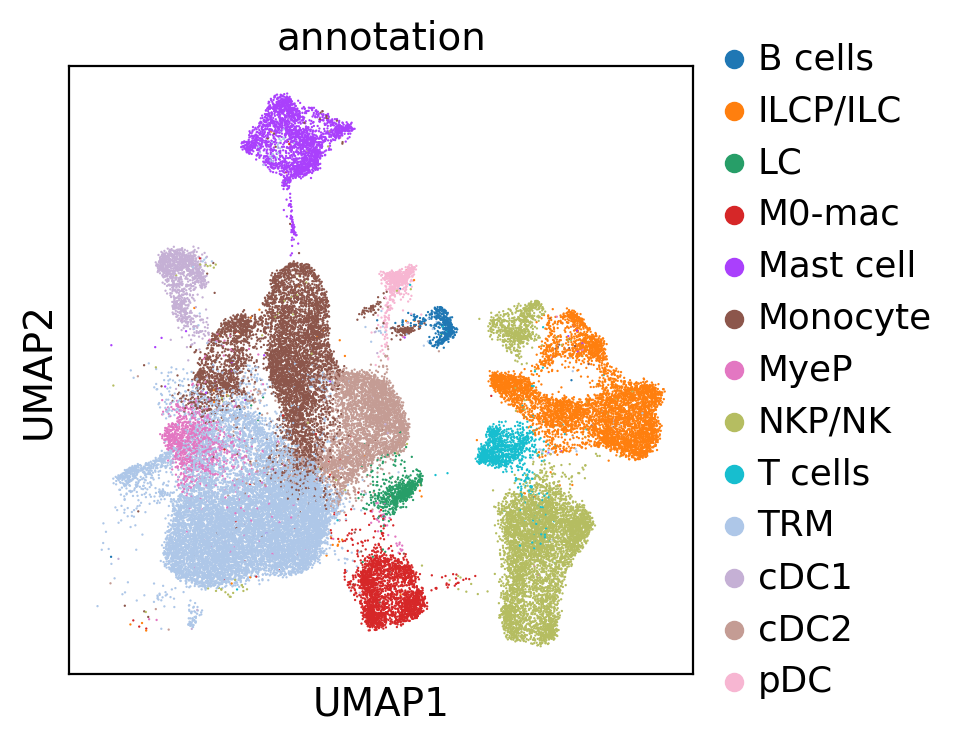

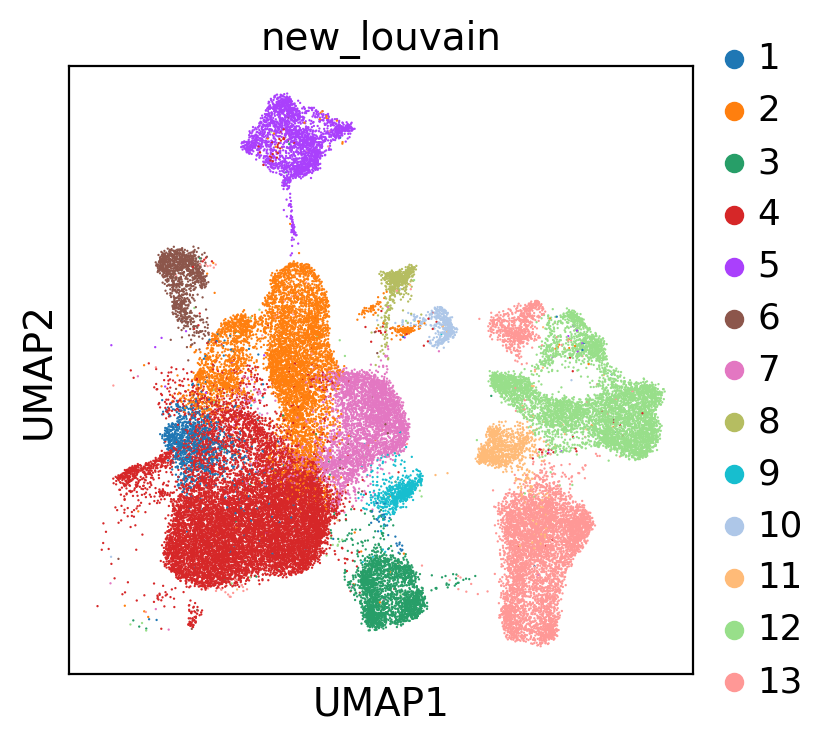

In [268]:
sc.pl.umap(MergedData_filter, color=['annotation',],save='Fig1_newcluster_annotation.pdf')
sc.pl.umap(MergedData_filter, color=['new_louvain',], save='Fig1_newcluster_louvain.pdf')

In [37]:
sc.tl.rank_genes_groups(MergedData_filter, groupby='new_louvain', method='wilcoxon', )

ranking genes


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:47)


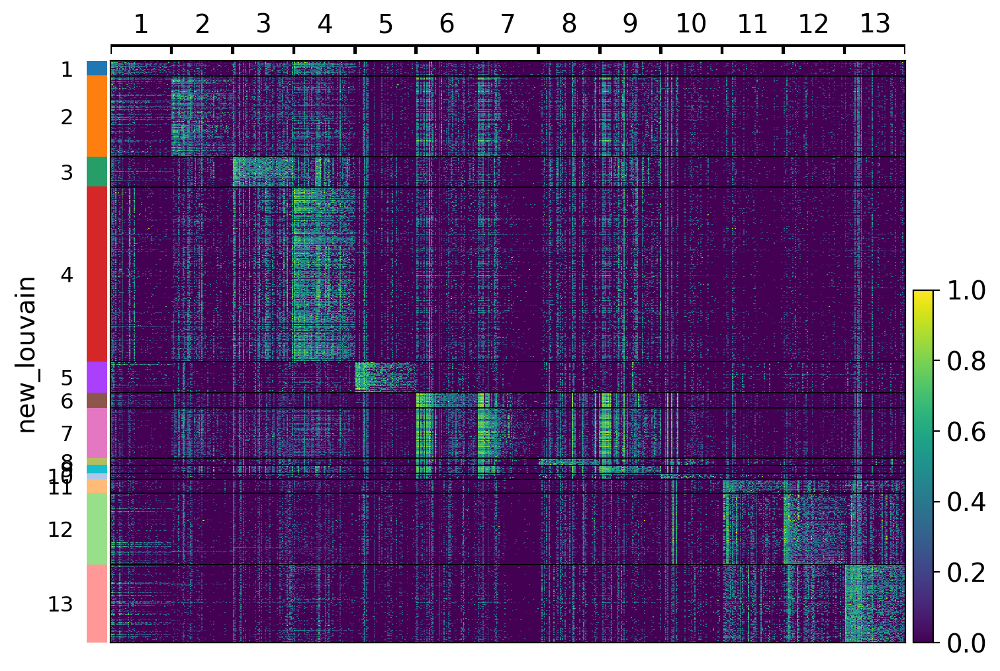

In [59]:
sc.pl.rank_genes_groups_heatmap(MergedData_filter,  n_genes=50, min_logfoldchange=2, groupby='new_louvain',dendrogram=False, standard_scale='var',cmap='viridis', save='GeneRank.pdf')

/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'group' as categorical


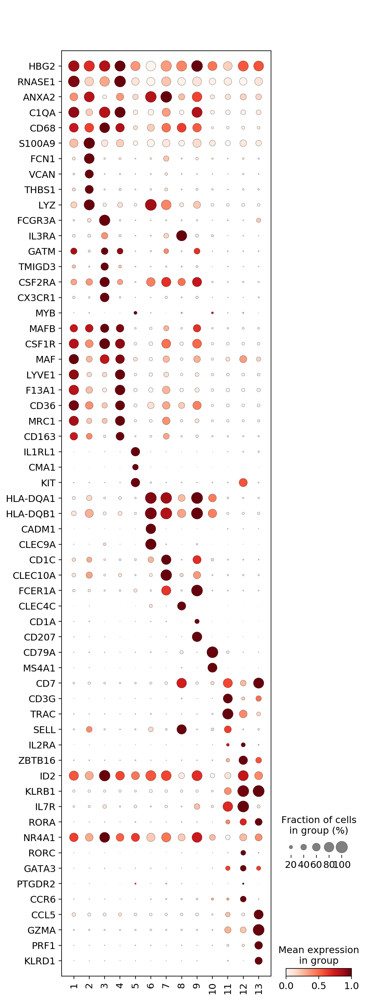

In [30]:
list_gene = ['HBG2','RNASE1','ANXA2','C1QA','CD68','S100A9','FCN1','VCAN','THBS1','LYZ','FCGR3A','IL3RA','GATM','TMIGD3','CSF2RA','CX3CR1','MYB','MAFB','CSF1R','MAF','LYVE1','F13A1','CD36','MRC1','CD163','IL1RL1','CMA1','KIT','HLA-DQA1','HLA-DQB1','CADM1','CLEC9A','CD1C','CLEC10A','FCER1A','CLEC4C','CD1A','CD207','CD79A','MS4A1','CD7','CD3G','TRAC','SELL','IL2RA','ZBTB16','ID2','KLRB1','IL7R','RORA','NR4A1','RORC','GATA3','PTGDR2','CCR6','CCL5','GZMA','PRF1','KLRD1']
sc.pl.dotplot(MergedData_filter, list_gene, groupby='new_louvain', standard_scale='var', use_raw=True, cmap='Reds',swap_axes=True, save='MarkerGeneDotplot.pdf')

In [250]:
dict_anno = {'3':'NKP/NK', '10':'NKP/NK', '21':'ILCP/ILC', '2':'ILCP/ILC','19':'T cells',
             '22':'NKP/NK', '20':'ILCP/ILC', '26':'B cells',
            '25':'pDC', '6':'Mast cell', '17':'cDC1', '4':'cDC2', '16':'cDC2','24':'LC', '8':'M0-mac',
            '7':'Monocyte', '23':'Monocyte', '13':'Monocyte','12':'Monocyte',
             '0':'TRM','1':'TRM','11':'TRM','5':'TRM','18':'MyeP',
            }
list_anno = []
for lv in MergedData_filter.obs['louvain']:
    if lv in dict_anno:
        list_anno.append(dict_anno[lv])
    else:
        print(lv)
MergedData_filter.obs['annotation'] = list_anno

Trying to set attribute `.obs` of view, copying.


In [251]:
dict_lov = {'MyeP':'1','Monocyte':'2','M0-mac':'3','TRM':'4','Mast cell':'5','cDC1':'6','cDC2':'7',
           'pDC':'8','LC':'9','B cells':'10','T cells':'11','ILCP/ILC':'12','NKP/NK':'13'}
list_new_louvain = []
for lv in MergedData_filter.obs['annotation']:
    if lv in dict_lov:
        list_new_louvain.append(dict_lov[lv])
    else:
        print(lv)
MergedData_filter.obs['new_louvain'] = list_new_louvain

In [73]:
Lymophiod = MergedData_filter[MergedData_filter.obs['annotation'].isin(['ILCP/ILC', 'NKP/NK', 'T cells'])]

/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [170]:
Myeloid = MergedData[MergedData.obs['TM']=='Myeloid']

/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


# PAGA analysis

In [295]:
def RunPAGA(adata):
    sc.tl.draw_graph(adata)
    sc.pl.draw_graph(adata, color='cellanno', legend_loc='on data')
    sc.tl.diffmap(adata)
    sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_diffmap')
    sc.tl.paga(adata, groups='cellanno')
    sc.pl.paga(adata)
    sc.tl.draw_graph(adata, init_pos='paga')
    sc.pl.draw_graph(adata, color='cellanno')
    sc.pl.paga_compare(
    adata, threshold=0.03, title='', right_margin=0.2, size=10, edge_width_scale=0.5,
    legend_fontsize=12, fontsize=12, frameon=False, edges=True, save=True)

drawing single-cell graph using layout 'fa'


Trying to set attribute `.uns` of view, copying.


    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:02:46)


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'group' as categorical
... storing 'cellanno' as categorical


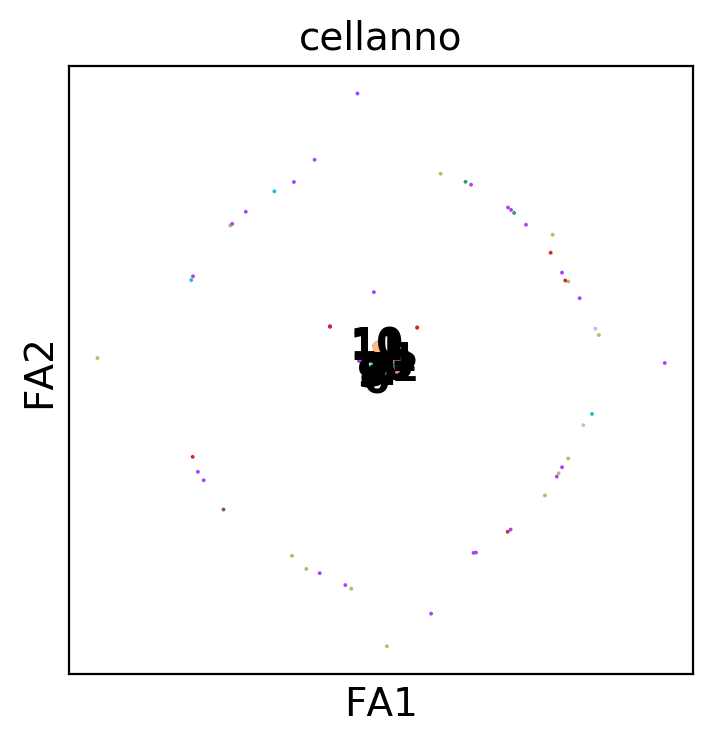

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/scanpy/neighbors/__init__.py:847: RuntimeWarning: divide by zero encountered in true_divide
  Q = scipy.sparse.spdiags(1.0/q, 0, W.shape[0], W.shape[0])
/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/scanpy/neighbors/__init__.py:857: RuntimeWarning: divide by zero encountered in true_divide
  self.Z = scipy.sparse.spdiags(1.0/z, 0, K.shape[0], K.shape[0])


    eigenvalues of transition matrix
    [ 1.          0.9999657   0.9999362   0.99680215  0.9952453   0.993604
      0.9929129   0.9916324   0.9902433   0.98863053 -0.9928957  -0.993485
     -0.9952302  -0.99679613 -0.9999657 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing neighbors


/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


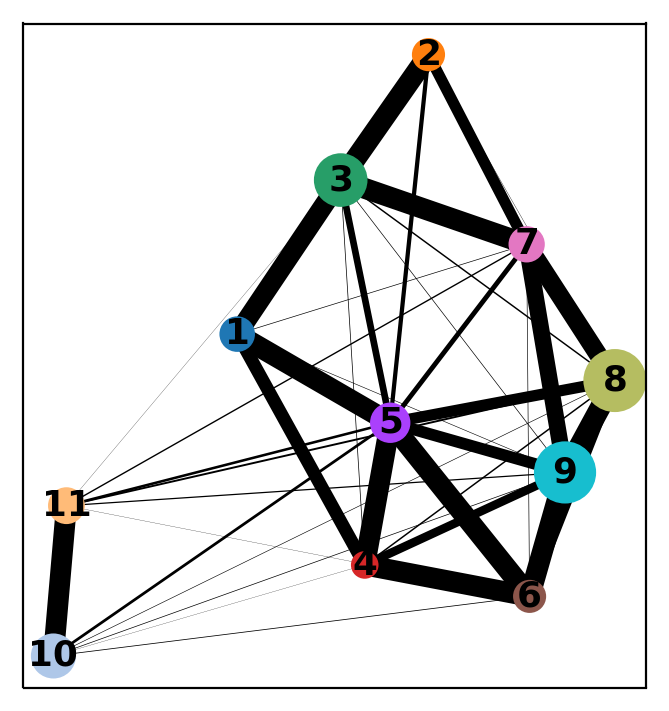

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:01:55)


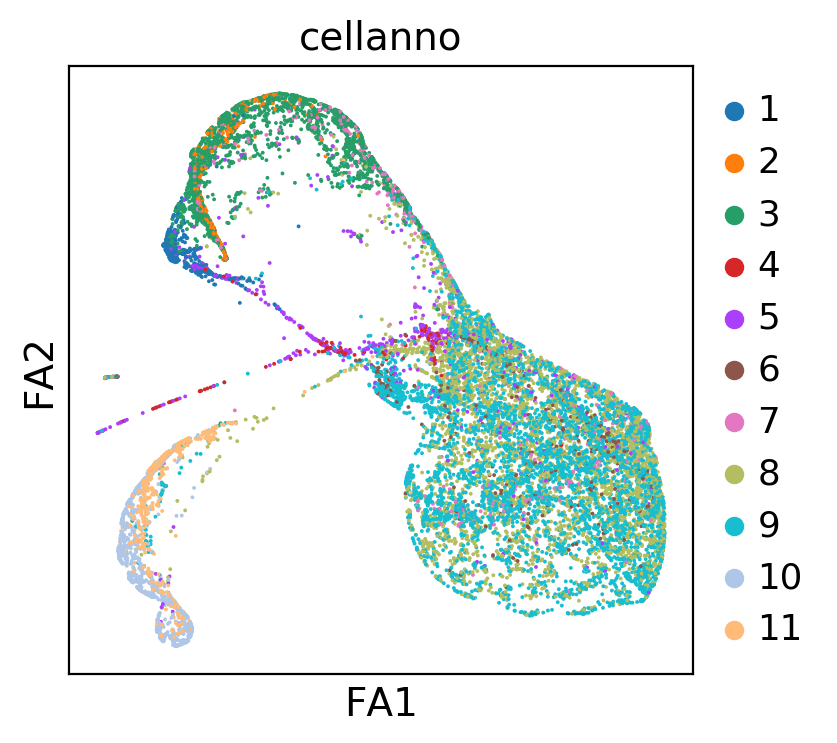

--> added 'pos', the PAGA positions (adata.uns['paga'])


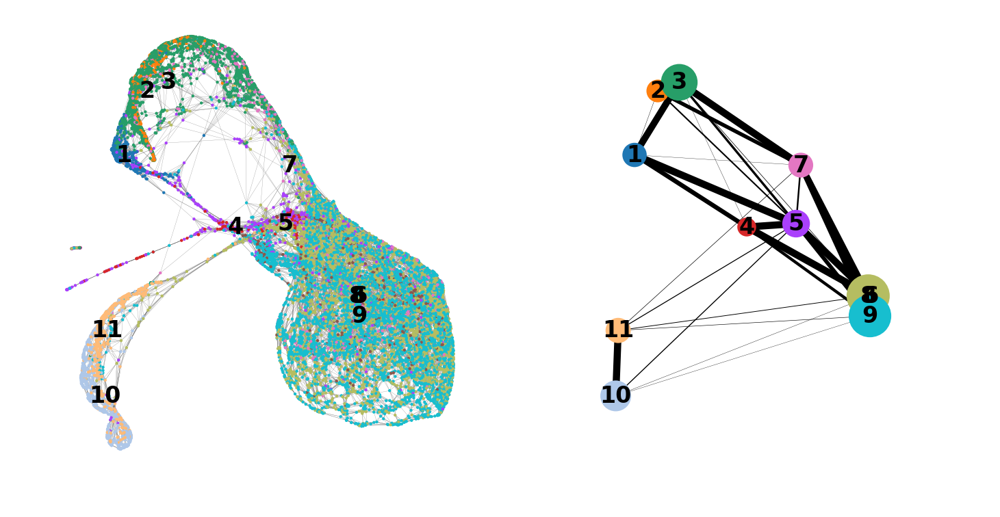

In [296]:
RunPAGA(Myeloid)

/home/lixuefei/Software/anaconda2/envs/scanpy-1.4.4/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'cellanno' as categorical


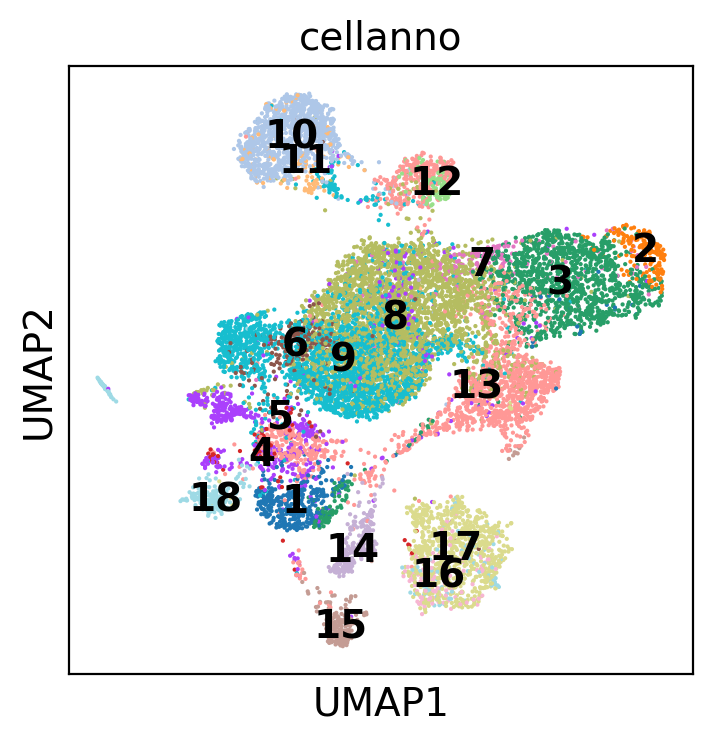

KeyError: 'annotation'

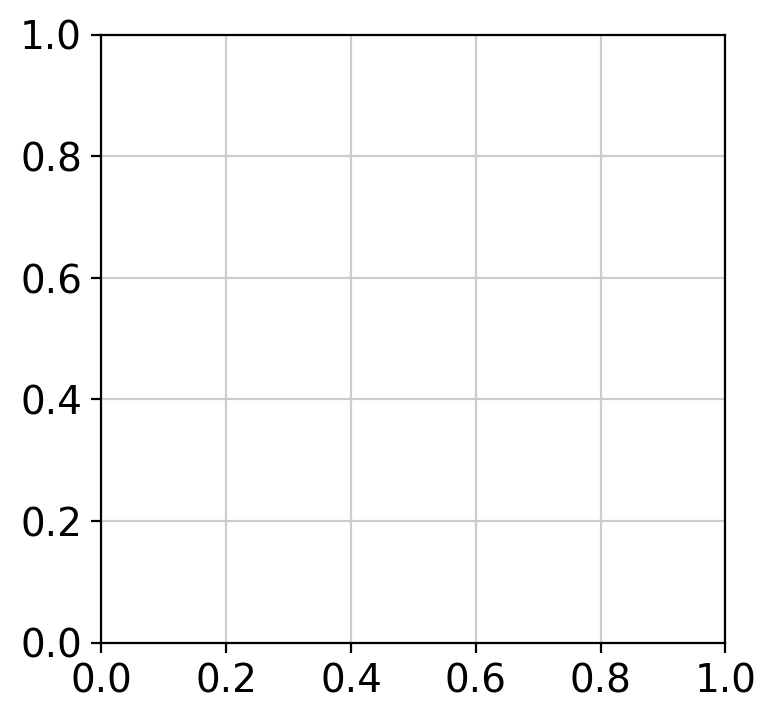

In [7]:
sc.pl.umap(Myeloid_f, color=['cellanno',], legend_loc='on data')
sc.pl.umap(Myeloid_f, color=['annotation',], )